# Tuberculosis detection in chest X-ray dataset

Here are the list of experiments
1. optimizer selection for CNN
2. CNN Model performance with different learning rate 
3. Batch Size selection for CNN
4. Different Dropout rate performance evaluation on CNN
5. Different weight decay rate performance evaluation on CNN
6. Momentum performance on ResNet18
7. Different Dropout rate performance evaluation on ResNet18
8. Different weight decay rate performance evaluation on ResNet18
9. CNN and Resnet18 Model performance comparision without regularization technique

Some important library file installation

In [ ]:
pip install tensorboard
pip install seaborn

Import all libraries

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import random_split, DataLoader
from torch.utils.tensorboard import SummaryWriter
import datetime
import os
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import torch.nn.functional as F
from torchvision.models import resnet18
import random
import pandas as pd

Model Architecture

In [2]:
# Simple convolutional neural network for chest Xray
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        
        self.fc1 = nn.Linear(64 * 56 * 56, 128)  
        self.fc2 = nn.Linear(128, 1) 

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 64 * 56 * 56)
        x = F.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))
        return x
    
#CNN with dropout    
class SimpleCNNwithDropout(nn.Module):
    def __init__(self, dropout_rate=0.5):
        super(SimpleCNNwithDropout, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.dropout = nn.Dropout(p=dropout_rate)
        self.fc1 = nn.Linear(64 * 56 * 56, 128)
        self.fc2 = nn.Linear(128, 1)

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = x.view(-1, 64 * 56 * 56)
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc2(x))
        return x


    
#Resnet18 model 

class ResNet18(nn.Module):
    def __init__(self, pretrained=True):
        super(ResNet18, self).__init__()
        self.model = resnet18(pretrained=pretrained)
        self.model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        num_features = self.model.fc.in_features
        self.model.fc = nn.Linear(num_features, 1)

    def forward(self, x):
        x = self.model(x)
        x = torch.sigmoid(x)
        return x
    
class ResNet18withDropout(nn.Module):
    def __init__(self, pretrained=True, dropout_rate=0.5):
        super(ResNet18withDropout, self).__init__()
        self.model = resnet18(pretrained=pretrained)
        self.model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        num_features = self.model.fc.in_features
        self.model.fc = nn.Linear(num_features, 1)
        self.dropout = nn.Dropout(p=dropout_rate)

    def forward(self, x):
        x = self.model(x)
        x = self.dropout(x)  
        x = torch.sigmoid(x)
        return x

# Data Preparation

In [3]:
# Define paths
dataset_dir = 'E:\\rhul\\Final Project\\3. Data processing\\dataset\\'
train_dir = os.path.join(dataset_dir, 'train')
test_dir = os.path.join(dataset_dir, 'test')

# Define classes
classes = ['Normal', 'TB']
for class_name in classes:
    class_dir = os.path.join(train_dir, class_name)
    images = os.listdir(class_dir)
    for i, image_name in enumerate(images[:5]):  # Check first 5 images
        image_path = os.path.join(class_dir, image_name)
        with Image.open(image_path) as img:
            print(f"Class: {class_name}, Image: {image_name}, Size: {img.size}")     
            
def count_images(directory, classes):
    counts = {}
    for class_name in classes:
        class_dir = os.path.join(directory, class_name)
        counts[class_name] = len(os.listdir(class_dir))
    return counts

train_counts = count_images(train_dir, classes)
test_counts = count_images(test_dir, classes)
df = pd.DataFrame({
    'Set': ['Train', 'Test'],
    'Normal': [train_counts['Normal'], test_counts['Normal']],
    'TB': [train_counts['TB'], test_counts['TB']],
    'Total': [train_counts['Normal'] + train_counts['TB'], test_counts['Normal'] + test_counts['TB']]})
print()
print("Image Distribution in Train and Test Sets:")
print(df)

Class: Normal, Image: Normal-1.png, Size: (512, 512)
Class: Normal, Image: Normal-10.png, Size: (512, 512)
Class: Normal, Image: Normal-100.png, Size: (512, 512)
Class: Normal, Image: Normal-1000.png, Size: (512, 512)
Class: Normal, Image: Normal-1001.png, Size: (512, 512)
Class: TB, Image: Tuberculosis-1.png, Size: (512, 512)
Class: TB, Image: Tuberculosis-10.png, Size: (512, 512)
Class: TB, Image: Tuberculosis-100.png, Size: (512, 512)
Class: TB, Image: Tuberculosis-101.png, Size: (512, 512)
Class: TB, Image: Tuberculosis-102.png, Size: (512, 512)

Image Distribution in Train and Test Sets:
     Set  Normal   TB  Total
0  Train    2800  560   3360
1   Test     700  140    840


In [4]:
def dataload(batch_size):
    
    transform_augment = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.Grayscale(num_output_channels=1),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),  
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])
    ])
    transform_normal = transforms.Compose([
        transforms.Resize((224, 224)), 
        transforms.Grayscale(num_output_channels=1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])
    ])

    trainset = torchvision.datasets.ImageFolder(root=train_dir, transform=transform_augment)
    testset = torchvision.datasets.ImageFolder(root=test_dir, transform=transform_normal)

    train_size = int(0.8 * len(trainset))
    val_size = len(trainset) - train_size
    trainset, valset = random_split(trainset, [train_size, val_size])


    traindataloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
    valdataloader = DataLoader(valset, batch_size=batch_size, shuffle=False)
    testdataloader = DataLoader(testset, batch_size=batch_size, shuffle=False)
    
    return traindataloader, valdataloader, testdataloader

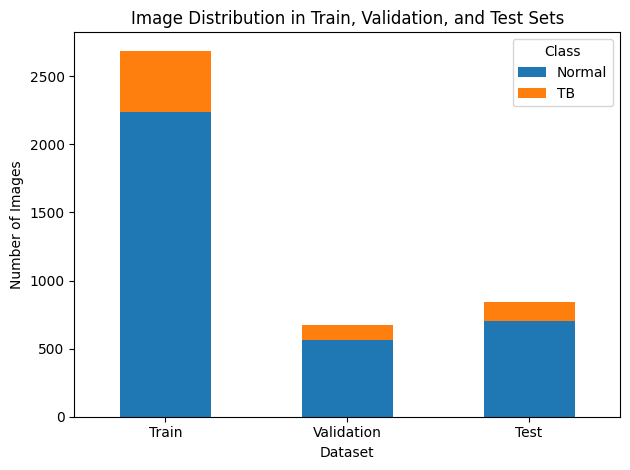

In [5]:
def count_images_in_loader(loader):
    class_counts = {class_name: 0 for class_name in classes}
    for images, labels in loader:
        for label in labels:
            class_name = classes[label.item()]
            class_counts[class_name] += 1
    return class_counts
batch_size = 32
traindataloader, valdataloader, testdataloader = dataload(batch_size)

train_counts = count_images_in_loader(traindataloader)
val_counts = count_images_in_loader(valdataloader)
test_counts = count_images_in_loader(testdataloader)

data = {
    'Set': ['Train', 'Validation', 'Test'],
    'Normal': [train_counts['Normal'], val_counts['Normal'], test_counts['Normal']],
    'TB': [train_counts['TB'], val_counts['TB'], test_counts['TB']]}
df_counts = pd.DataFrame(data)

# data Plotting
df_counts.set_index('Set').plot(kind='bar', stacked=True)
plt.title('Image Distribution in Train, Validation, and Test Sets')
plt.xlabel('Dataset')
plt.ylabel('Number of Images')
plt.xticks(rotation=0)
plt.legend(title='Class')
plt.tight_layout()
plt.show()

Random data image visualization

Label: TB


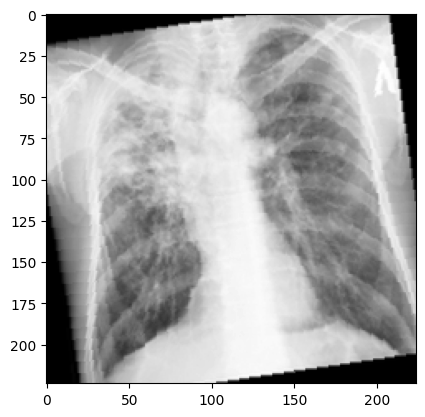

Total number of training samples: 2688
Total number of validation samples: 672
Total number of test samples: 840


In [8]:
def imshow(img):
    img = img / 2 + 0.5
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)), cmap='gray')
    plt.show()
traindataloader, valdataloader, testdataloader = dataload(batch_size=64)
dataiter = iter(traindataloader)
images, labels = next(dataiter)

index = torch.randint(0, len(images), (1,)).item()
print(f'Label: {"TB" if labels[index].item() == 1 else "Normal"}')
imshow(images[index])

train_size = sum(len(batch[0]) for batch in traindataloader)
val_size = sum(len(batch[0]) for batch in valdataloader)
test_size = sum(len(batch[0]) for batch in testdataloader)

# Print the results
print(f'Total number of training samples: {train_size}')
print(f'Total number of validation samples: {val_size}')
print(f'Total number of test samples: {test_size}')

# Model training and validation function

In [6]:
def train_model(model, traindataloader, criterion, optimizer):
    model.train()  
    running_loss = 0.0
    correct = 0
    total = 0
    all_labels = []
    all_preds = []

    for images, labels in traindataloader:
        optimizer.zero_grad()  
        outputs = model(images)  # Forward pass

        loss = criterion(outputs, labels.float().unsqueeze(1))
        loss.backward()  
        optimizer.step() 

        running_loss += loss.item()
        predicted = (outputs.data > 0.5).float() 
        total += labels.size(0)
        correct += (predicted.squeeze() == labels).sum().item()

        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy().squeeze())

    train_loss = running_loss / len(traindataloader)  
    train_accuracy = 100 * correct / total  
    cm = confusion_matrix(all_labels, all_preds) 

    return train_loss, train_accuracy, cm

In [7]:
def validate_model(model, valdataloader, criterion):
    model.eval()  
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad(): 
        for images, labels in valdataloader:
            outputs = model(images)
            loss = criterion(outputs, labels.float().unsqueeze(1)) 
            val_loss += loss.item()
            predicted = (outputs.data > 0.5).float()
            total += labels.size(0)
            correct += (predicted.squeeze() == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy().squeeze())

    val_loss /= len(valdataloader)  
    val_accuracy = 100 * correct / total 
    cm = confusion_matrix(all_labels, all_preds) 

    return val_loss, val_accuracy, cm

In [8]:
def test_model(model, testdataloader, criterion):
    model.eval() 
    test_loss = 0.0
    correct = 0
    total = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in testdataloader:
            outputs = model(images) 
            loss = criterion(outputs, labels.float().unsqueeze(1))  
            test_loss += loss.item()
            predicted = (outputs.data > 0.5).float() 
            total += labels.size(0)
            correct += (predicted.squeeze() == labels).sum().item() 

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy().squeeze())

    test_loss /= len(testdataloader)
    test_accuracy = 100 * correct / total  
    cm = confusion_matrix(all_labels, all_preds) 

    return test_loss, test_accuracy, cm

In [9]:
def run_experiment(model_class, opt_class, opt_name, lr, batch_size, num_epochs, weight_decay, dropout_rate):
    traindataloader, valdataloader, testdataloader = dataload(batch_size)
    if 'Dropout' in model_class.__name__:
        model = model_class(dropout_rate=dropout_rate)
    else:
        model = model_class()
        
    if opt_name == 'MOMENTUM':
        optimizer = opt_class(model.parameters(), lr=lr, weight_decay=weight_decay, momentum=0.9)
    else:
        optimizer = opt_class(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.BCELoss()

    current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    log_dir = f'logs/{model_class.__name__}_{opt_name}_lr_{lr}_bs_{batch_size}_dr_{dropout_rate}_wd_{weight_decay}_{current_time}'
    os.makedirs(log_dir, exist_ok=True)
    writer = SummaryWriter(log_dir)

    sample_images, _ = next(iter(traindataloader))
    writer.add_graph(model, sample_images)
    
    train_losses = []
    val_losses = []
    test_losses=[]
    train_accuracies=[]
    val_accuracies=[]
    test_accuracies=[]

    for epoch in range(num_epochs):
        train_loss, train_accuracy, train_cm = train_model(model, traindataloader, criterion, optimizer)
        val_loss, val_accuracy, val_cm = validate_model(model, valdataloader, criterion)
        
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)

        writer.add_scalar('Loss/Train', train_loss, epoch+1)
        writer.add_scalar('Loss/Validation', val_loss, epoch+1)
        writer.add_scalar('Accuracy/Train', train_accuracy, epoch+1)
        writer.add_scalar('Accuracy/Validation', val_accuracy, epoch+1)

        if epoch == 0:
            img_grid = torchvision.utils.make_grid(sample_images)
            writer.add_image('mnist_images', img_grid)

        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, '
              f'Train Accuracy: {train_accuracy:.2f}%, Val Accuracy: {val_accuracy:.2f}%')       

    test_loss, test_accuracy, test_cm = test_model(model, testdataloader, criterion)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)
    
    print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%')

    plot_confusion_matrix(test_cm,log_dir, epoch, 'test', model_class.__name__, opt_name, lr,batch_size)
    visualize_predictions_randomimg(model, testdataloader, classes)
    writer.close()
    
    return {
        'model': model_class.__name__,
        'optimizer': opt_name,
        'learning_rate': lr,
        'batch_size': batch_size,
        'weight_decay':weight_decay,
        'dropout_rate':dropout_rate,
        'train_loss': train_loss,
        'val_loss': val_loss,
        'test_loss': test_loss,
        'train_accuracy': train_accuracy,
        'val_accuracy': val_accuracy,
        'test_accuracy': test_accuracy,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'test_losses':test_losses,
        'train_accuracies': train_accuracies,
        'val_accuracies': val_accuracies,
        'test_accuracies':test_accuracies
    }


In [10]:
   
def plot_confusion_matrix(cm, log_dir, epoch, split,model_name, opt_name, learning_rate,batch_size, class_names=['Normal', 'TB']):
    plt.figure(figsize=(5, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix - Epoch {epoch+1} - {split}')
    plt.savefig(os.path.join(log_dir, f'confusion_matrix_epoch_{epoch+1}_{split}.png'))
    plt.show()

In [11]:
def visualize_predictions_randomimg(model, data_loader, class_names, num_images=10):
    model.eval()
    data_list = list(data_loader)    
    images, labels = random.choice(data_list)    
    outputs = model(images)
    _, preds = torch.max(outputs, 1)
    fig = plt.figure(figsize=(10, 4))
    for idx in range(min(num_images, len(images))):
        ax = fig.add_subplot(2, num_images // 2, idx + 1, xticks=[], yticks=[])
        img = images[idx].cpu().numpy().transpose((1, 2, 0))
        img = (img * 0.5) + 0.5  # unnormalize
        img = img.squeeze()
        plt.imshow(img, cmap='gray')
        ax.set_title(f"Pred: {class_names[preds[idx]]}, True: {class_names[labels[idx]]}", 
                     color=("green" if preds[idx] == labels[idx] else "red"), fontsize=5)
    plt.tight_layout()
    plt.show()

# Experiment 1. optimizer selection for CNN

Running experiment with optimizer: SGD
Epoch [1/10], Train Loss: 0.3654, Val Loss: 0.3306, Train Accuracy: 82.89%, Val Accuracy: 84.08%
Epoch [2/10], Train Loss: 0.2483, Val Loss: 0.2609, Train Accuracy: 89.06%, Val Accuracy: 90.92%
Epoch [3/10], Train Loss: 0.2158, Val Loss: 0.2483, Train Accuracy: 91.29%, Val Accuracy: 90.03%
Epoch [4/10], Train Loss: 0.1761, Val Loss: 0.2144, Train Accuracy: 92.93%, Val Accuracy: 92.71%
Epoch [5/10], Train Loss: 0.1612, Val Loss: 0.1960, Train Accuracy: 93.82%, Val Accuracy: 93.75%
Epoch [6/10], Train Loss: 0.1516, Val Loss: 0.1856, Train Accuracy: 94.05%, Val Accuracy: 93.90%
Epoch [7/10], Train Loss: 0.1278, Val Loss: 0.1769, Train Accuracy: 95.24%, Val Accuracy: 94.64%
Epoch [8/10], Train Loss: 0.1362, Val Loss: 0.3291, Train Accuracy: 95.39%, Val Accuracy: 88.39%
Epoch [9/10], Train Loss: 0.1339, Val Loss: 0.1856, Train Accuracy: 95.05%, Val Accuracy: 94.20%
Epoch [10/10], Train Loss: 0.1146, Val Loss: 0.1591, Train Accuracy: 95.91%, Val Accurac

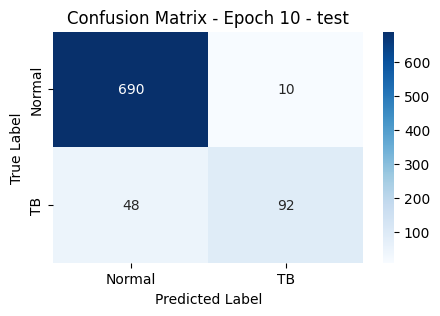

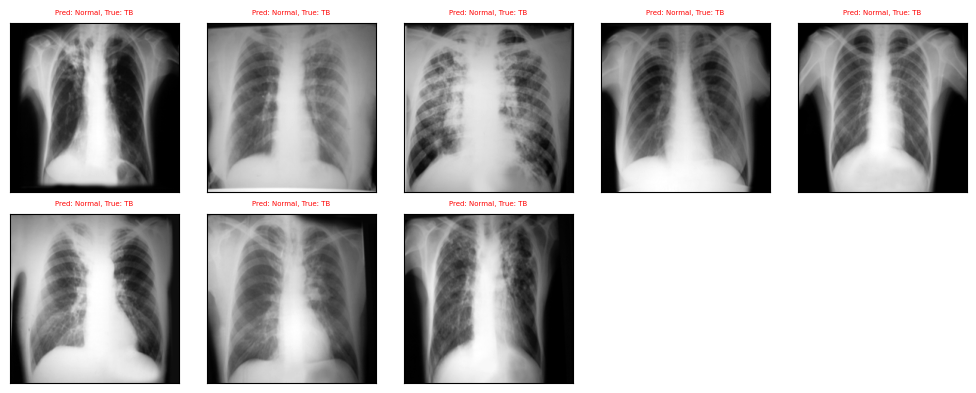

Running experiment with optimizer: MOMENTUM
Epoch [1/10], Train Loss: 0.3575, Val Loss: 0.1874, Train Accuracy: 85.42%, Val Accuracy: 92.56%
Epoch [2/10], Train Loss: 0.1871, Val Loss: 0.1345, Train Accuracy: 92.89%, Val Accuracy: 95.24%
Epoch [3/10], Train Loss: 0.1451, Val Loss: 0.1171, Train Accuracy: 94.90%, Val Accuracy: 96.13%
Epoch [4/10], Train Loss: 0.1096, Val Loss: 0.1309, Train Accuracy: 96.24%, Val Accuracy: 94.94%
Epoch [5/10], Train Loss: 0.0973, Val Loss: 0.1441, Train Accuracy: 96.61%, Val Accuracy: 93.15%
Epoch [6/10], Train Loss: 0.0918, Val Loss: 0.0789, Train Accuracy: 96.88%, Val Accuracy: 97.32%
Epoch [7/10], Train Loss: 0.0909, Val Loss: 0.0874, Train Accuracy: 96.54%, Val Accuracy: 97.02%
Epoch [8/10], Train Loss: 0.0799, Val Loss: 0.0818, Train Accuracy: 97.02%, Val Accuracy: 97.32%
Epoch [9/10], Train Loss: 0.0842, Val Loss: 0.1561, Train Accuracy: 97.32%, Val Accuracy: 92.86%
Epoch [10/10], Train Loss: 0.0716, Val Loss: 0.0829, Train Accuracy: 97.51%, Val Ac

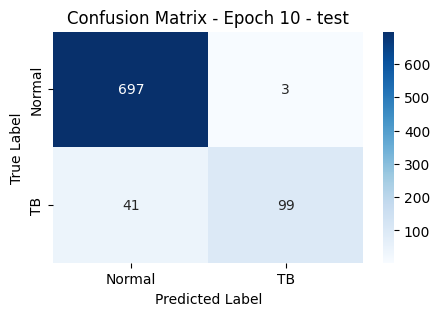

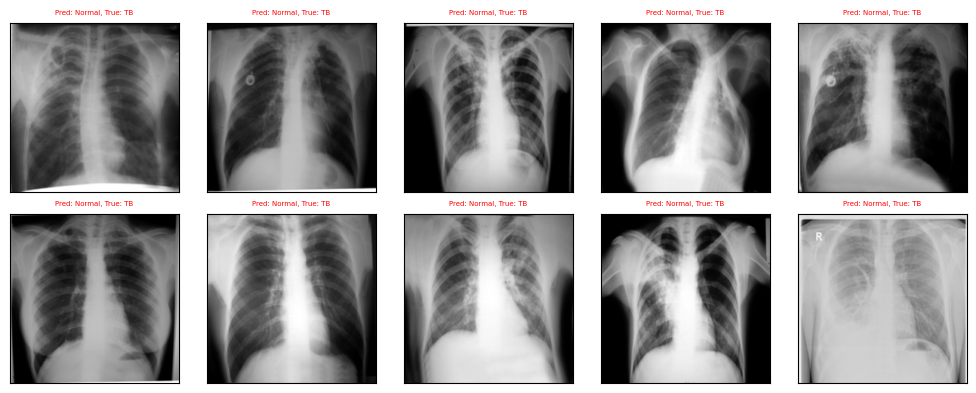

Running experiment with optimizer: Adam
Epoch [1/10], Train Loss: 15.8079, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [2/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [3/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [4/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [5/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [6/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [7/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [8/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [9/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy: 83.26%, Val Accuracy: 83.63%
Epoch [10/10], Train Loss: 16.7411, Val Loss: 16.6193, Train Accuracy

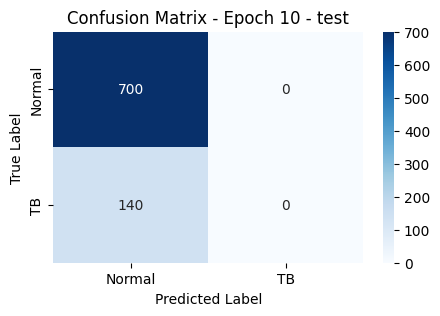

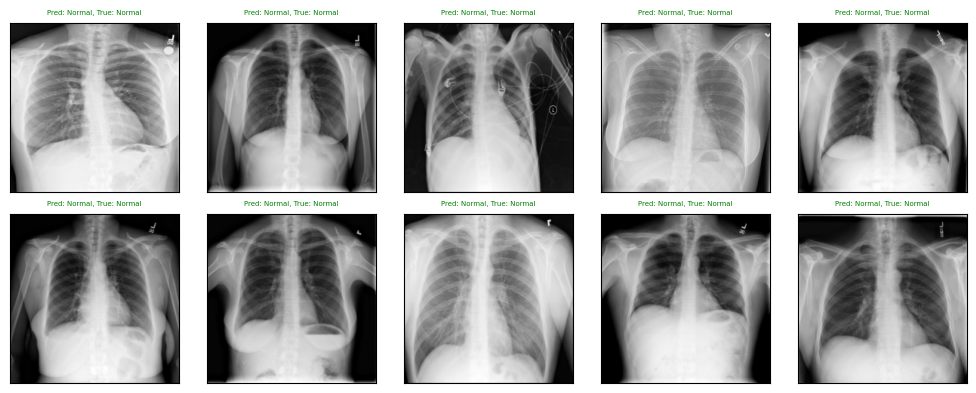

Running experiment with optimizer: RMSProp
Epoch [1/10], Train Loss: 16.6086, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [2/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [3/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [4/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [5/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [6/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [7/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [8/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [9/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accuracy: 83.04%, Val Accuracy: 84.52%
Epoch [10/10], Train Loss: 16.9643, Val Loss: 15.6250, Train Accur

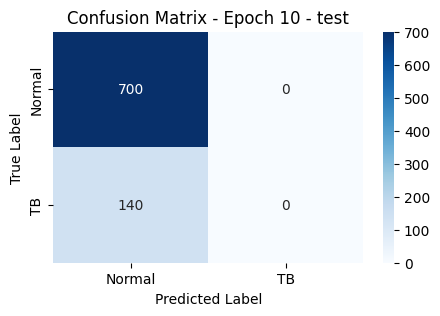

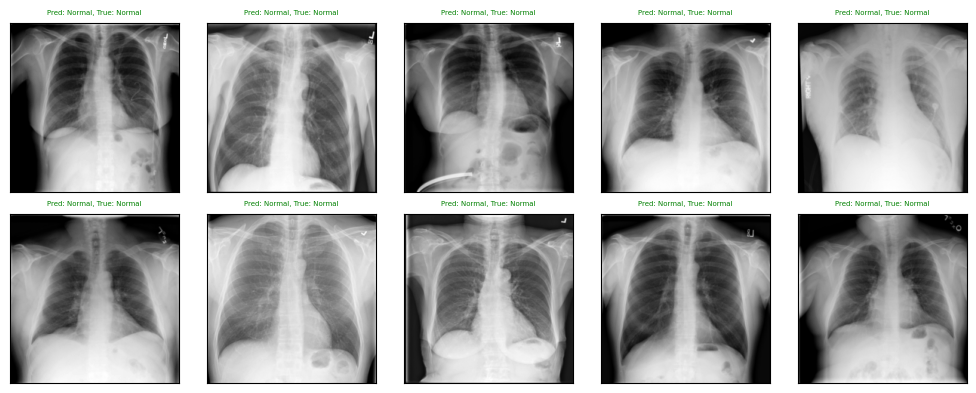

In [54]:
default_lrs = {
    'SGD': 0.01,
    'MOMENTUM': 0.01,
    'Adam': 0.001,
    'RMSProp': 0.001,}

optimizers = [
    ('SGD', optim.SGD),
    ('MOMENTUM', optim.SGD),
    ('Adam', optim.Adam),
    ('RMSProp', optim.RMSprop),]
batch_size = 64
num_epochs = 10
weight_decay = 0
dropout_rate = 0
CNNselection_result = []
for opt_name, opt_class in optimizers:
    print(f'Running experiment with optimizer: {opt_name}')
    lr = default_lrs[opt_name]
    result = run_experiment(SimpleCNN, opt_class, opt_name, lr, batch_size, num_epochs, weight_decay, dropout_rate)
    CNNselection_result.append(result)


In [55]:
def plot_accuracy_bar_graph(results,model_class):
    optimizers = [result['optimizer'] for result in results]
    train_accuracies = [result['train_accuracy'] for result in results]
    val_accuracies = [result['val_accuracy'] for result in results]
    model = [result['model'] for result in results]
    x = np.arange(len(optimizers))
    width = 0.20
    fig, ax = plt.subplots(figsize=(15, 8))
    bars1 = ax.bar(x - width/2, train_accuracies, width, label='Train Accuracy')
    bars2 = ax.bar(x + width/2, val_accuracies, width, label='Validation Accuracy')

    ax.set_xlabel('Optimizers')
    ax.set_ylabel('Accuracy (%)')
    ax.set_title(f'Training and Validation Accuracy for Different Optimizers with {model_class.__name__}')
    ax.set_xticks(x)
    ax.set_xticklabels(optimizers)
    ax.legend()

    for bar in bars1:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval - 15, f'{yval:.2f}%', ha='center', va='bottom')
        
    for bar in bars2:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval - 15, f'{yval:.2f}%', ha='center', va='bottom')

    plt.ylim(0, 100)
    plt.show()    

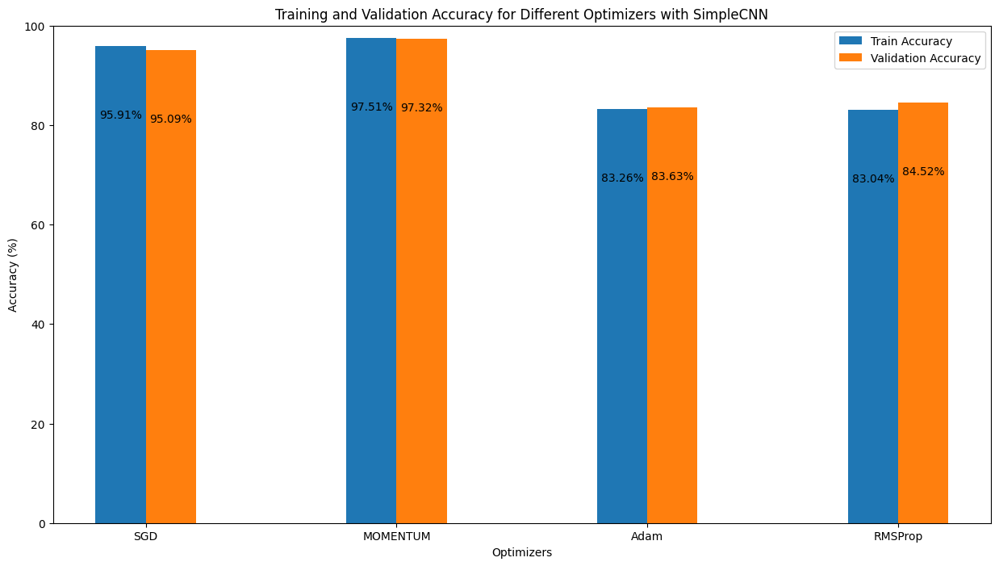

In [56]:
plot_accuracy_bar_graph(CNNselection_result,SimpleCNN)

Epoch [1/10], Train Loss: 0.4721, Val Loss: 0.1983, Train Accuracy: 85.94%, Val Accuracy: 92.56%
Epoch [2/10], Train Loss: 0.1391, Val Loss: 0.1583, Train Accuracy: 95.24%, Val Accuracy: 94.94%
Epoch [3/10], Train Loss: 0.1119, Val Loss: 0.1476, Train Accuracy: 96.35%, Val Accuracy: 94.20%
Epoch [4/10], Train Loss: 0.0964, Val Loss: 0.1404, Train Accuracy: 96.73%, Val Accuracy: 95.24%
Epoch [5/10], Train Loss: 0.0781, Val Loss: 0.0981, Train Accuracy: 97.54%, Val Accuracy: 96.28%
Epoch [6/10], Train Loss: 0.0694, Val Loss: 0.0900, Train Accuracy: 97.69%, Val Accuracy: 96.58%
Epoch [7/10], Train Loss: 0.0603, Val Loss: 0.0890, Train Accuracy: 97.77%, Val Accuracy: 97.32%
Epoch [8/10], Train Loss: 0.0578, Val Loss: 0.0980, Train Accuracy: 98.14%, Val Accuracy: 97.17%
Epoch [9/10], Train Loss: 0.0513, Val Loss: 0.1202, Train Accuracy: 98.44%, Val Accuracy: 97.17%
Epoch [10/10], Train Loss: 0.0543, Val Loss: 0.1147, Train Accuracy: 98.47%, Val Accuracy: 95.98%
Test Loss: 0.1454, Test Accur

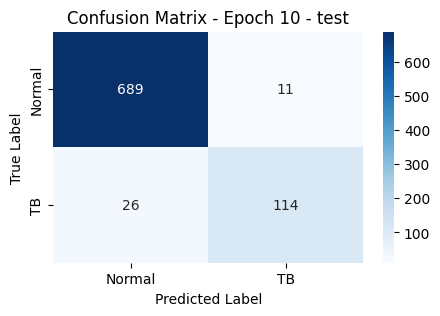

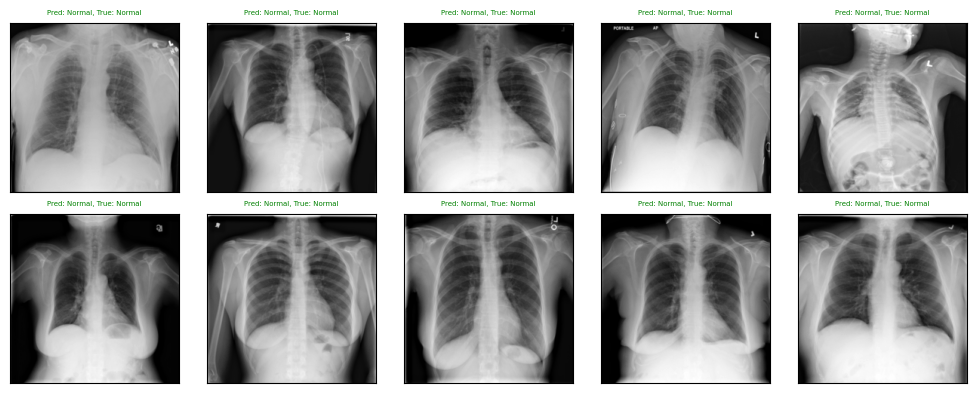

{'model': 'SimpleCNN',
 'optimizer': 'Adam',
 'learning_rate': 0.001,
 'batch_size': 64,
 'weight_decay': 0,
 'dropout_rate': 0,
 'train_loss': 0.054259500155846276,
 'val_loss': 0.11465786329724571,
 'test_loss': 0.14536580110767058,
 'train_accuracy': 98.47470238095238,
 'val_accuracy': 95.98214285714286,
 'test_accuracy': 95.5952380952381,
 'train_losses': [0.4721160156741029,
  0.13912132160649412,
  0.11194763607567265,
  0.09636461136064359,
  0.07811244798912889,
  0.06936601185727687,
  0.06028764468750784,
  0.05776751675598678,
  0.05133146623016468,
  0.054259500155846276],
 'val_losses': [0.19826170869848944,
  0.15833009102127768,
  0.1476429429921237,
  0.140424676916816,
  0.09812615269964392,
  0.08996552770788019,
  0.08902968923476609,
  0.09801843051205981,
  0.12016938084905798,
  0.11465786329724571],
 'test_losses': [0.14536580110767058],
 'train_accuracies': [85.9375,
  95.23809523809524,
  96.35416666666667,
  96.72619047619048,
  97.54464285714286,
  97.6934523

In [64]:
optimizers = [('Adam', optim.Adam, {'lr': 0.001, 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0, 'amsgrad': False}),]
# Experiment parameters
batch_size = 64
num_epochs = 10
dropout_rate = 0

opt_name, opt_class, opt_params = optimizers[0]
model = SimpleCNN()
optimizer = opt_class(model.parameters(), **opt_params)
run_experiment(SimpleCNN, opt_class, opt_name, opt_params['lr'], batch_size, num_epochs, opt_params['weight_decay'], dropout_rate)


# Experiment 2. Model performance with different learning rate

In [42]:
def run_experiment(model_class, opt_class, opt_name, lr, batch_size, num_epochs, weight_decay, dropout_rate):
    traindataloader, valdataloader, testdataloader = dataload(batch_size)
    if 'Dropout' in model_class.__name__:
        model = model_class(dropout_rate=dropout_rate)
    else:
        model = model_class()
        
    if opt_name == 'MOMENTUM':
        optimizer = opt_class(model.parameters(), lr=lr, weight_decay=weight_decay, momentum=0.9)
    else:
        optimizer = opt_class(model.parameters(), lr=lr, weight_decay=weight_decay)

    criterion = nn.BCELoss()
    current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    log_dir = f'logs/{model_class.__name__}_{opt_name}_lr_{lr}_bs_{batch_size}_dr_{dropout_rate}_wd_{weight_decay}_{current_time}'
    os.makedirs(log_dir, exist_ok=True)
    writer = SummaryWriter(log_dir)

    sample_images, _ = next(iter(traindataloader))
    writer.add_graph(model, sample_images)
    
    train_losses = []
    val_losses = []
    test_losses=[]
    train_accuracies=[]
    val_accuracies=[]
    test_accuracies=[]

    for epoch in range(num_epochs):
        train_loss, train_accuracy, train_cm = train_model(model, traindataloader, criterion, optimizer)
        val_loss, val_accuracy, val_cm = validate_model(model, valdataloader, criterion)
        
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)

        writer.add_scalar('Loss/Train', train_loss, epoch+1)
        writer.add_scalar('Loss/Validation', val_loss, epoch+1)
        writer.add_scalar('Accuracy/Train', train_accuracy, epoch+1)
        writer.add_scalar('Accuracy/Validation', val_accuracy, epoch+1)

        if epoch == 0:
            img_grid = torchvision.utils.make_grid(sample_images)
            writer.add_image('mnist_images', img_grid)

        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, '
              f'Train Accuracy: {train_accuracy:.2f}%, Val Accuracy: {val_accuracy:.2f}%')

        #plot_confusion_matrix(train_cm,log_dir, epoch, 'train', model_class.__name__, opt_name, lr,batch_size)
        #plot_confusion_matrix(val_cm, log_dir, epoch, 'validation', model_class.__name__, opt_name, lr,batch_size)

    test_loss, test_accuracy, test_cm = test_model(model, testdataloader, criterion)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)
    
    print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%')

    plot_confusion_matrix(test_cm,log_dir, epoch, 'test', model_class.__name__, opt_name, lr,batch_size)
    #visualize_predictions(model, testdataloader, classes)
    visualize_predictions_randomimg(model, testdataloader, classes)
    writer.close()
    
    return {
        'model': model_class.__name__,
        'optimizer': opt_name,
        'learning_rate': lr,
        'batch_size': batch_size,
        'weight_decay':weight_decay,
        'dropout_rate':dropout_rate,
        'train_loss': train_loss,
        'val_loss': val_loss,
        'test_loss': test_loss,
        'train_accuracy': train_accuracy,
        'val_accuracy': val_accuracy,
        'test_accuracy': test_accuracy,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'test_losses':test_losses,
        'train_accuracies': train_accuracies,
        'val_accuracies': val_accuracies,
        'test_accuracies':test_accuracies
    }


Running experiment with learning rate: 0.1
Epoch [1/10], Train Loss: 0.5478, Val Loss: 0.4088, Train Accuracy: 82.14%, Val Accuracy: 84.08%
Epoch [2/10], Train Loss: 5.0862, Val Loss: 0.4432, Train Accuracy: 80.95%, Val Accuracy: 84.08%
Epoch [3/10], Train Loss: 0.4549, Val Loss: 0.4396, Train Accuracy: 83.04%, Val Accuracy: 84.08%
Epoch [4/10], Train Loss: 0.4568, Val Loss: 0.4350, Train Accuracy: 83.15%, Val Accuracy: 84.08%
Epoch [5/10], Train Loss: 0.4545, Val Loss: 0.4312, Train Accuracy: 83.15%, Val Accuracy: 84.08%
Epoch [6/10], Train Loss: 0.4542, Val Loss: 0.4318, Train Accuracy: 83.15%, Val Accuracy: 84.08%
Epoch [7/10], Train Loss: 0.4540, Val Loss: 0.4319, Train Accuracy: 83.15%, Val Accuracy: 84.08%
Epoch [8/10], Train Loss: 0.4541, Val Loss: 0.4325, Train Accuracy: 83.15%, Val Accuracy: 84.08%
Epoch [9/10], Train Loss: 0.4544, Val Loss: 0.4328, Train Accuracy: 83.15%, Val Accuracy: 84.08%
Epoch [10/10], Train Loss: 0.4539, Val Loss: 0.4324, Train Accuracy: 83.15%, Val Acc

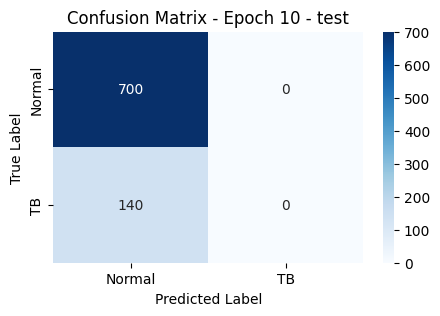

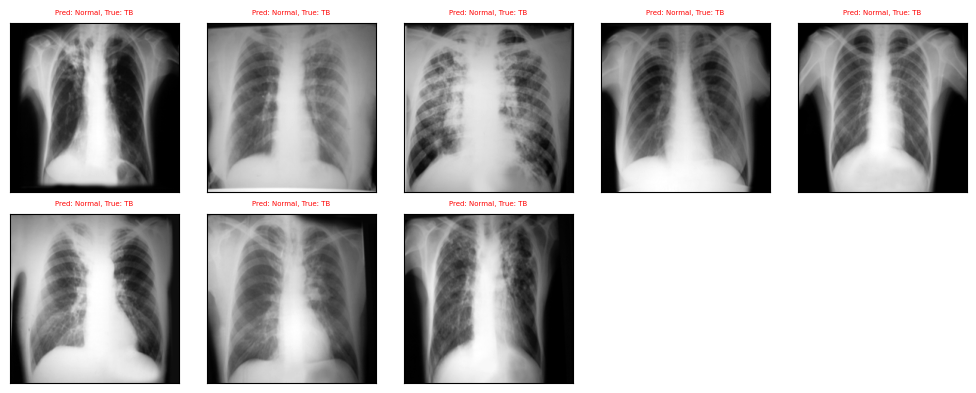

Running experiment with learning rate: 0.01
Epoch [1/10], Train Loss: 0.3540, Val Loss: 0.2512, Train Accuracy: 85.16%, Val Accuracy: 88.69%
Epoch [2/10], Train Loss: 0.2052, Val Loss: 0.3118, Train Accuracy: 92.41%, Val Accuracy: 85.71%
Epoch [3/10], Train Loss: 0.1645, Val Loss: 0.1173, Train Accuracy: 93.97%, Val Accuracy: 95.83%
Epoch [4/10], Train Loss: 0.1198, Val Loss: 0.1229, Train Accuracy: 95.65%, Val Accuracy: 94.94%
Epoch [5/10], Train Loss: 0.1139, Val Loss: 0.1017, Train Accuracy: 95.98%, Val Accuracy: 96.13%
Epoch [6/10], Train Loss: 0.0970, Val Loss: 0.1151, Train Accuracy: 96.84%, Val Accuracy: 95.68%
Epoch [7/10], Train Loss: 0.0889, Val Loss: 0.0903, Train Accuracy: 96.95%, Val Accuracy: 96.73%
Epoch [8/10], Train Loss: 0.0685, Val Loss: 0.0854, Train Accuracy: 97.77%, Val Accuracy: 97.62%
Epoch [9/10], Train Loss: 0.0719, Val Loss: 0.0631, Train Accuracy: 97.92%, Val Accuracy: 98.21%
Epoch [10/10], Train Loss: 0.0637, Val Loss: 0.0739, Train Accuracy: 97.81%, Val Ac

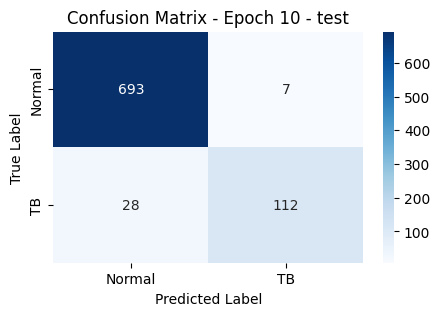

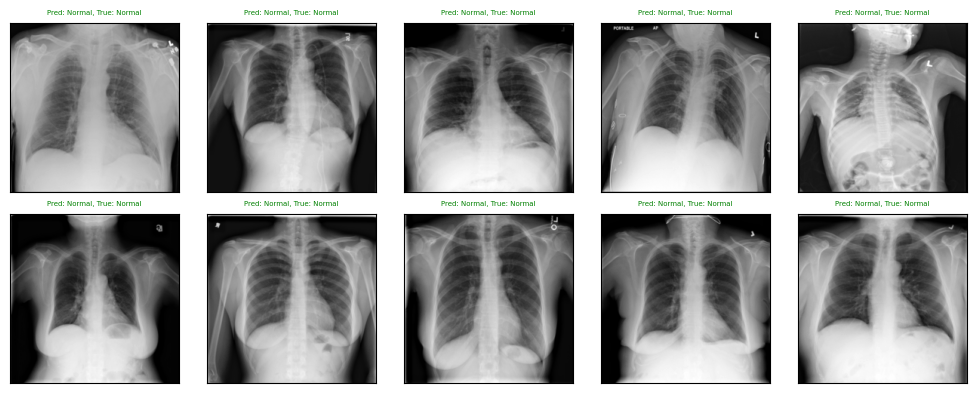

Running experiment with learning rate: 0.02
Epoch [1/10], Train Loss: 0.3380, Val Loss: 0.1739, Train Accuracy: 86.87%, Val Accuracy: 94.35%
Epoch [2/10], Train Loss: 0.1591, Val Loss: 0.1150, Train Accuracy: 94.23%, Val Accuracy: 96.73%
Epoch [3/10], Train Loss: 0.1206, Val Loss: 0.1908, Train Accuracy: 95.61%, Val Accuracy: 92.56%
Epoch [4/10], Train Loss: 0.1081, Val Loss: 0.1110, Train Accuracy: 95.76%, Val Accuracy: 96.28%
Epoch [5/10], Train Loss: 0.0943, Val Loss: 0.1207, Train Accuracy: 96.95%, Val Accuracy: 97.32%
Epoch [6/10], Train Loss: 0.0977, Val Loss: 0.1593, Train Accuracy: 97.14%, Val Accuracy: 95.09%
Epoch [7/10], Train Loss: 0.0935, Val Loss: 0.1045, Train Accuracy: 96.88%, Val Accuracy: 97.47%
Epoch [8/10], Train Loss: 0.0765, Val Loss: 0.1067, Train Accuracy: 97.28%, Val Accuracy: 96.43%
Epoch [9/10], Train Loss: 0.0608, Val Loss: 0.2526, Train Accuracy: 97.54%, Val Accuracy: 89.43%
Epoch [10/10], Train Loss: 0.0799, Val Loss: 0.0860, Train Accuracy: 97.21%, Val Ac

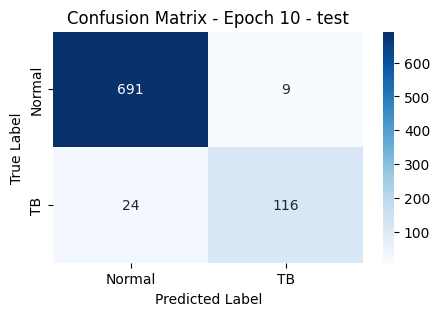

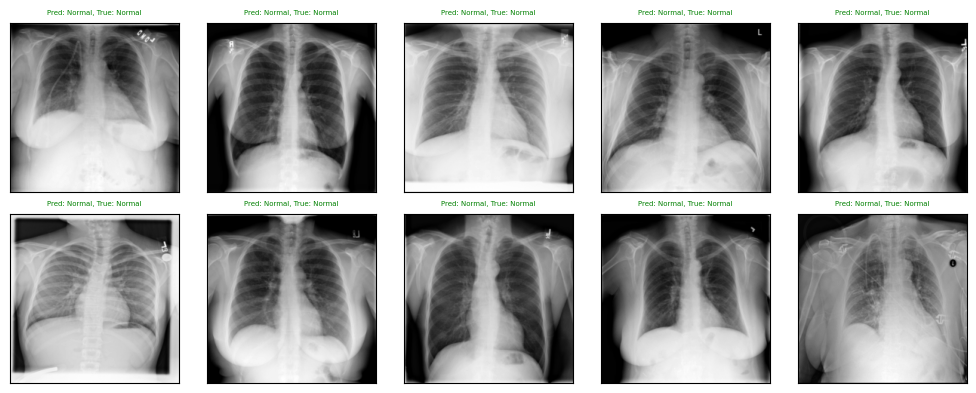

Running experiment with learning rate: 0.001
Epoch [1/10], Train Loss: 0.4269, Val Loss: 0.3912, Train Accuracy: 83.74%, Val Accuracy: 81.70%
Epoch [2/10], Train Loss: 0.3162, Val Loss: 0.2931, Train Accuracy: 84.30%, Val Accuracy: 83.63%
Epoch [3/10], Train Loss: 0.2382, Val Loss: 0.2209, Train Accuracy: 90.36%, Val Accuracy: 91.67%
Epoch [4/10], Train Loss: 0.1931, Val Loss: 0.1891, Train Accuracy: 92.75%, Val Accuracy: 93.15%
Epoch [5/10], Train Loss: 0.1670, Val Loss: 0.1766, Train Accuracy: 94.12%, Val Accuracy: 93.45%
Epoch [6/10], Train Loss: 0.1540, Val Loss: 0.1598, Train Accuracy: 94.83%, Val Accuracy: 94.35%
Epoch [7/10], Train Loss: 0.1384, Val Loss: 0.1502, Train Accuracy: 94.90%, Val Accuracy: 94.49%
Epoch [8/10], Train Loss: 0.1297, Val Loss: 0.1708, Train Accuracy: 95.76%, Val Accuracy: 93.60%
Epoch [9/10], Train Loss: 0.1222, Val Loss: 0.1335, Train Accuracy: 95.65%, Val Accuracy: 95.68%
Epoch [10/10], Train Loss: 0.1118, Val Loss: 0.1280, Train Accuracy: 96.43%, Val A

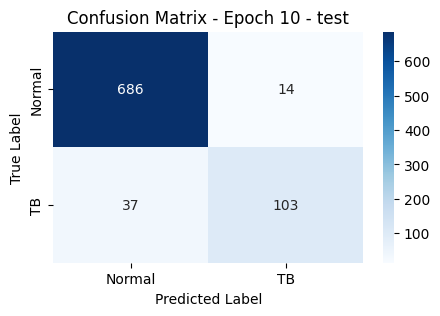

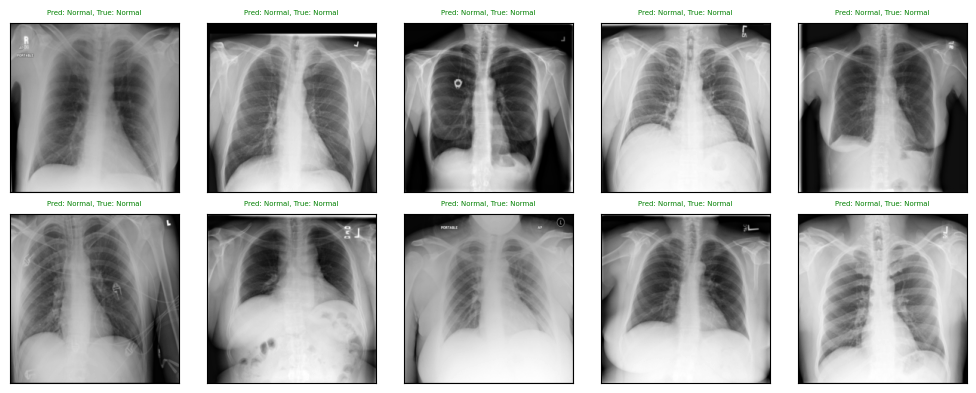

Running experiment with learning rate: 0.002
Epoch [1/10], Train Loss: 0.4203, Val Loss: 0.3227, Train Accuracy: 83.15%, Val Accuracy: 84.23%
Epoch [2/10], Train Loss: 0.2597, Val Loss: 0.1863, Train Accuracy: 88.24%, Val Accuracy: 93.30%
Epoch [3/10], Train Loss: 0.1832, Val Loss: 0.1550, Train Accuracy: 93.23%, Val Accuracy: 94.64%
Epoch [4/10], Train Loss: 0.1486, Val Loss: 0.1309, Train Accuracy: 94.75%, Val Accuracy: 96.28%
Epoch [5/10], Train Loss: 0.1265, Val Loss: 0.1164, Train Accuracy: 95.54%, Val Accuracy: 96.73%
Epoch [6/10], Train Loss: 0.1115, Val Loss: 0.1126, Train Accuracy: 96.32%, Val Accuracy: 96.13%
Epoch [7/10], Train Loss: 0.1065, Val Loss: 0.1093, Train Accuracy: 96.24%, Val Accuracy: 96.58%
Epoch [8/10], Train Loss: 0.0944, Val Loss: 0.0957, Train Accuracy: 96.65%, Val Accuracy: 97.32%
Epoch [9/10], Train Loss: 0.0879, Val Loss: 0.0967, Train Accuracy: 97.14%, Val Accuracy: 97.32%
Epoch [10/10], Train Loss: 0.0873, Val Loss: 0.1006, Train Accuracy: 96.84%, Val A

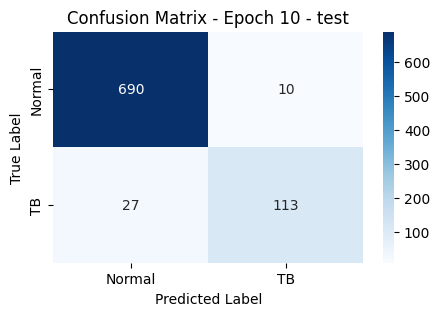

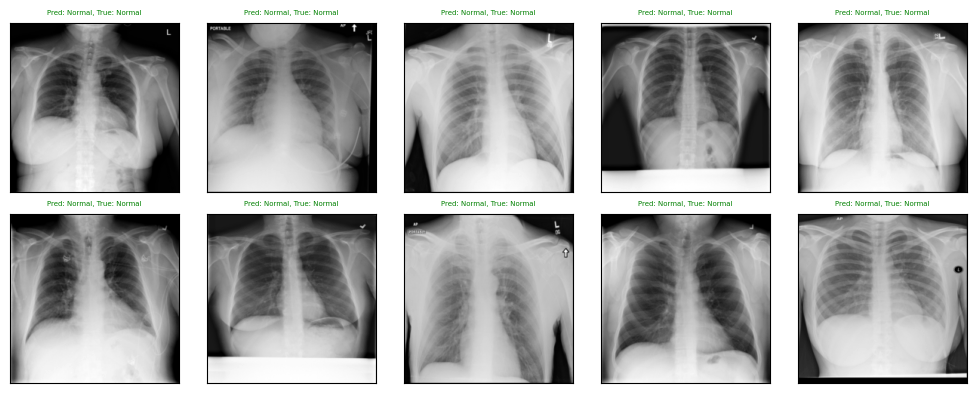

In [44]:
# Experiment running for different optimizers without any regularization
optimizers = [
    ('MOMENTUM', optim.SGD),
]
batch_size = 64
num_epochs = 10
weight_decay=0
dropout_rate=0
learning_rate=[0.1,0.01,0.02,0.001,0.002]


# Running experiments
CNNselection_lr_result = []

for opt_name, opt_class in optimizers:
    for lr in learning_rate:
        print(f'Running experiment with learning rate: {lr}')
        result = run_experiment(SimpleCNN,opt_class,opt_name,lr,batch_size,num_epochs,weight_decay,dropout_rate)
        CNNselection_lr_result.append(result)

# Experiment 3. Batch Size selection for CNN

Running experiment with batch: 32
Epoch [1/10], Train Loss: 0.3231, Val Loss: 0.2476, Train Accuracy: 86.57%, Val Accuracy: 88.54%
Epoch [2/10], Train Loss: 0.1980, Val Loss: 0.1716, Train Accuracy: 91.93%, Val Accuracy: 93.60%
Epoch [3/10], Train Loss: 0.1530, Val Loss: 0.1448, Train Accuracy: 94.83%, Val Accuracy: 95.68%
Epoch [4/10], Train Loss: 0.1264, Val Loss: 0.1288, Train Accuracy: 96.09%, Val Accuracy: 95.68%
Epoch [5/10], Train Loss: 0.1009, Val Loss: 0.1552, Train Accuracy: 97.02%, Val Accuracy: 93.30%
Epoch [6/10], Train Loss: 0.1020, Val Loss: 0.1082, Train Accuracy: 96.50%, Val Accuracy: 96.43%
Epoch [7/10], Train Loss: 0.0850, Val Loss: 0.1251, Train Accuracy: 97.17%, Val Accuracy: 95.83%
Epoch [8/10], Train Loss: 0.0820, Val Loss: 0.0958, Train Accuracy: 97.14%, Val Accuracy: 97.17%
Epoch [9/10], Train Loss: 0.0900, Val Loss: 0.1323, Train Accuracy: 96.73%, Val Accuracy: 94.79%
Epoch [10/10], Train Loss: 0.0740, Val Loss: 0.0863, Train Accuracy: 97.77%, Val Accuracy: 97

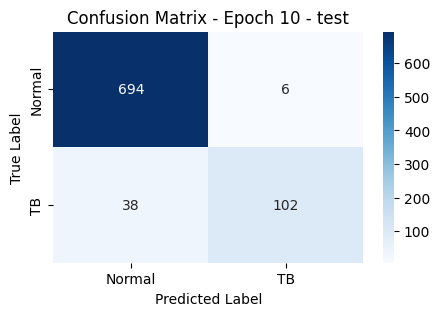

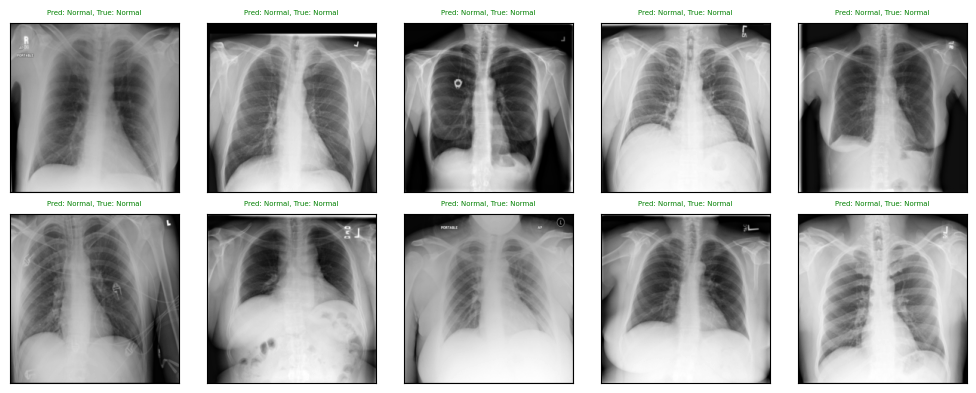

Running experiment with batch: 64
Epoch [1/10], Train Loss: 0.4106, Val Loss: 0.3119, Train Accuracy: 83.52%, Val Accuracy: 87.05%
Epoch [2/10], Train Loss: 0.2527, Val Loss: 0.2223, Train Accuracy: 89.69%, Val Accuracy: 90.62%
Epoch [3/10], Train Loss: 0.1944, Val Loss: 0.1760, Train Accuracy: 92.67%, Val Accuracy: 92.86%
Epoch [4/10], Train Loss: 0.1599, Val Loss: 0.1630, Train Accuracy: 94.49%, Val Accuracy: 93.75%
Epoch [5/10], Train Loss: 0.1369, Val Loss: 0.1316, Train Accuracy: 95.57%, Val Accuracy: 94.79%
Epoch [6/10], Train Loss: 0.1261, Val Loss: 0.1284, Train Accuracy: 95.83%, Val Accuracy: 95.39%
Epoch [7/10], Train Loss: 0.1147, Val Loss: 0.1630, Train Accuracy: 96.24%, Val Accuracy: 93.75%
Epoch [8/10], Train Loss: 0.1047, Val Loss: 0.1147, Train Accuracy: 96.54%, Val Accuracy: 96.13%
Epoch [9/10], Train Loss: 0.0995, Val Loss: 0.0934, Train Accuracy: 96.43%, Val Accuracy: 96.73%
Epoch [10/10], Train Loss: 0.1015, Val Loss: 0.0982, Train Accuracy: 96.50%, Val Accuracy: 96

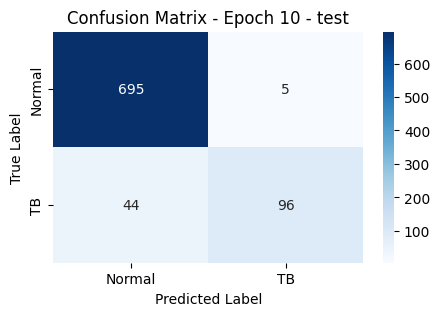

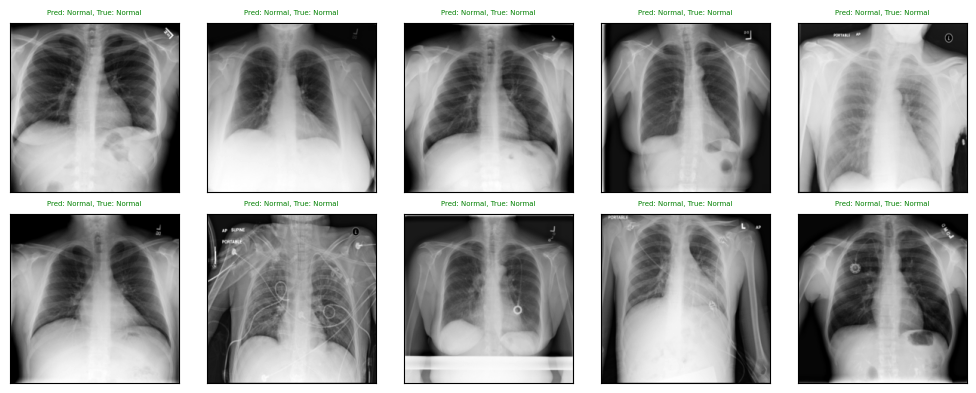

Running experiment with batch: 128
Epoch [1/10], Train Loss: 0.4625, Val Loss: 0.4162, Train Accuracy: 80.28%, Val Accuracy: 82.74%
Epoch [2/10], Train Loss: 0.3577, Val Loss: 0.3364, Train Accuracy: 83.48%, Val Accuracy: 82.74%
Epoch [3/10], Train Loss: 0.2802, Val Loss: 0.2580, Train Accuracy: 86.16%, Val Accuracy: 89.29%
Epoch [4/10], Train Loss: 0.2225, Val Loss: 0.2112, Train Accuracy: 91.59%, Val Accuracy: 90.77%
Epoch [5/10], Train Loss: 0.1851, Val Loss: 0.1875, Train Accuracy: 93.30%, Val Accuracy: 93.15%
Epoch [6/10], Train Loss: 0.1629, Val Loss: 0.1782, Train Accuracy: 94.31%, Val Accuracy: 93.30%
Epoch [7/10], Train Loss: 0.1526, Val Loss: 0.1730, Train Accuracy: 94.27%, Val Accuracy: 94.05%
Epoch [8/10], Train Loss: 0.1376, Val Loss: 0.1531, Train Accuracy: 94.90%, Val Accuracy: 94.35%
Epoch [9/10], Train Loss: 0.1266, Val Loss: 0.1464, Train Accuracy: 95.31%, Val Accuracy: 94.05%
Epoch [10/10], Train Loss: 0.1174, Val Loss: 0.1544, Train Accuracy: 95.76%, Val Accuracy: 9

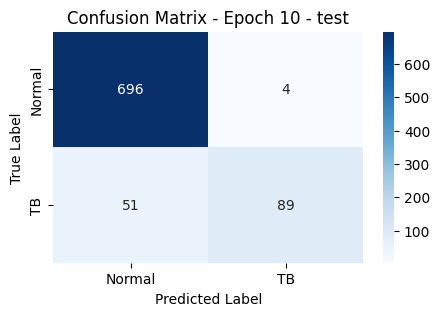

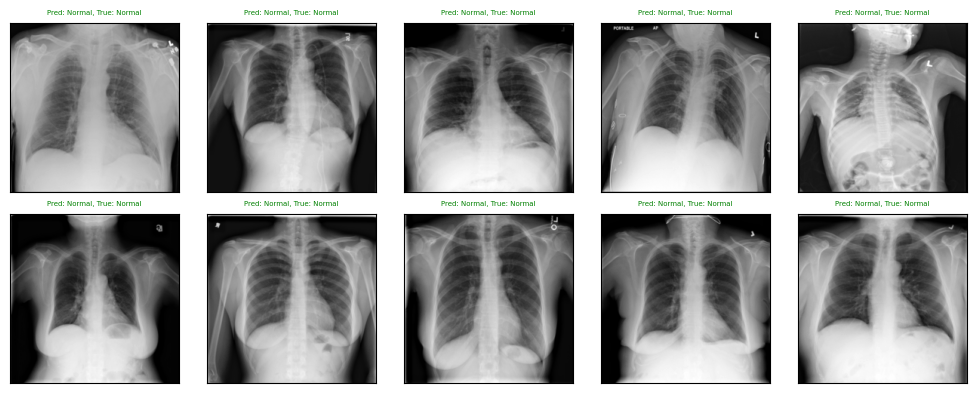

In [49]:
# Experiment running for different optimizers without any regularization
optimizers = [('MOMENTUM', optim.SGD),]
batch_sizes = [32,64,128]
num_epochs = 10
weight_decay=0
dropout_rate=0
learning_rate=0.01
CNNselection_batch_result = []

for opt_name, opt_class in optimizers:
    for batch_size in batch_sizes:
        print(f'Running experiment with batch: {batch_size}')
        result = run_experiment(SimpleCNN,opt_class,opt_name,lr,batch_size,num_epochs,weight_decay,dropout_rate)
        CNNselection_batch_result.append(result)

In [52]:
def plot_loss_graph_Batch(results):
    # Extract loss data for each optimizer
    train_losses = [result['train_losses'] for result in results]
    val_losses = [result['val_losses'] for result in results]
    batch_size = [result['batch_size'] for result in results]
    num_epochs = len(train_losses[0])  
    fig, axs = plt.subplots(2, 1, figsize=(15, 15))

    # Plot training losses
    for i, batch_size in enumerate(batch_sizes):
        axs[0].plot(np.arange(1, num_epochs + 1), train_losses[i], label=f'Train Loss - {batch_size}', marker='o')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].set_title('Training Losses for Different Optimizers')
    axs[0].legend()

    # Plot validation losses
    for i, batch_size in enumerate(batch_sizes):
        axs[1].plot(np.arange(1, num_epochs + 1), val_losses[i], label=f'Validation Loss - {batch_size}', marker='o')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].set_title('Validation Losses for Different Optimizers')
    axs[1].legend()
    
    plt.tight_layout()
    plt.show()

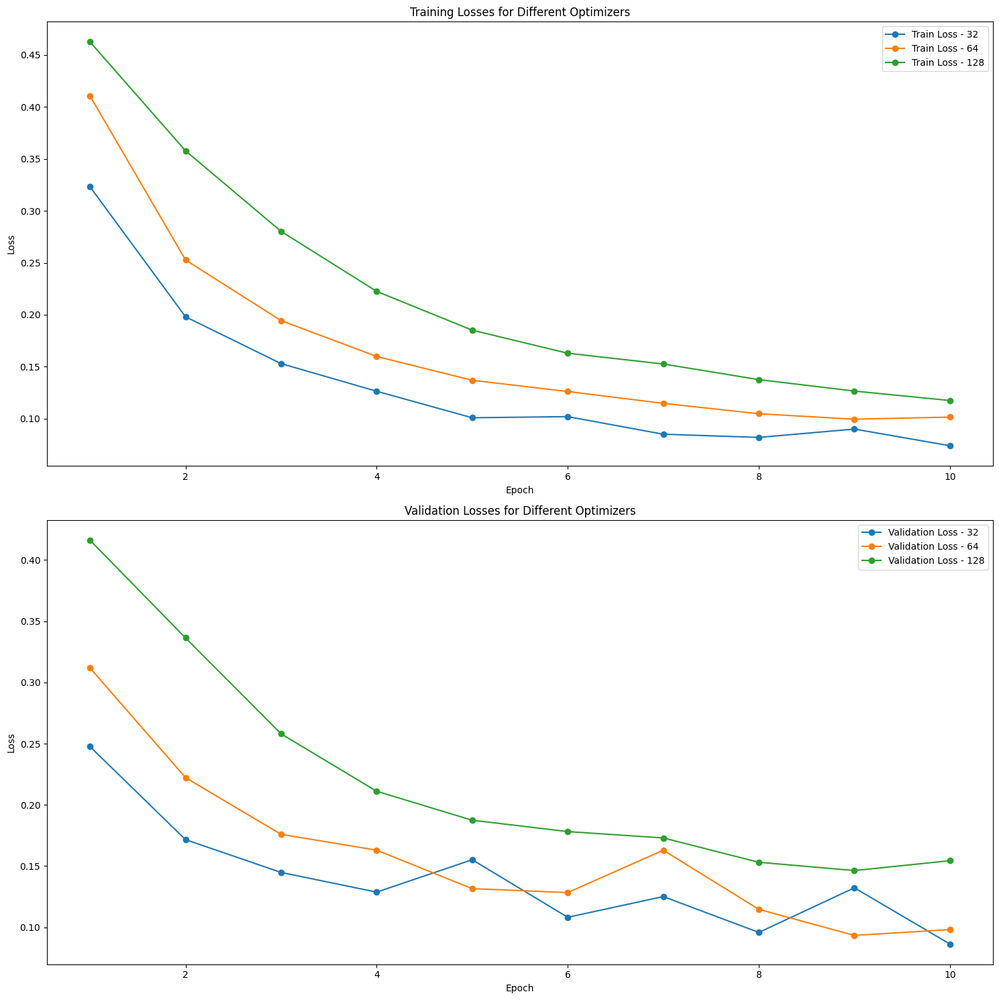

In [53]:
plot_loss_graph_Batch(CNNselection_batch_result)

# Experiment 4. CNN model performace for Dropout regularization

In [11]:
def plot_dropout_results(results, model_class):
    # Extract labels and metrics
    dropout_rates = [result['dropout_rate'] for result in results]
    labels = [f"dr={dropout_rate}" for dropout_rate in dropout_rates]
    
    train_losses = [result['train_losses'] for result in results]
    val_losses = [result['val_losses'] for result in results]
    test_losses = [result['test_loss'] for result in results]
    
    train_accuracies = [result['train_accuracies'] for result in results]
    val_accuracies = [result['val_accuracies'] for result in results]
    test_accuracies = [result['test_accuracy'] for result in results]

    epochs = range(1, len(train_losses[0]) + 1)

    # Plot Train Loss
    plt.figure(figsize=(8, 4))
    for i, label in enumerate(labels):
        plt.plot(epochs, train_losses[i], label=label)
    plt.title(f'Train Loss Comparison: {model_class.__name__} model')
    plt.xlabel('Epochs')
    plt.ylabel('Train Loss')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # Plot Validation Loss
    plt.figure(figsize=(8, 4))
    for i, label in enumerate(labels):
        plt.plot(epochs, val_losses[i], label=label)
    plt.title(f'Validation Loss Comparison: {model_class.__name__} model')
    plt.xlabel('Epochs')
    plt.ylabel('Validation Loss')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # Plot Test Loss vs Dropout Rate
    plt.figure(figsize=(8, 4))
    plt.plot(dropout_rates, test_losses, 'o-', label='Test Loss')
    plt.title(f'Test Loss Comparison: {model_class.__name__} model')
    plt.xlabel('Dropout Rate')
    plt.ylabel('Test Loss')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
    # Plot Train Accuracy
    plt.figure(figsize=(8, 4))
    for i, label in enumerate(labels):
        plt.plot(epochs, train_accuracies[i], label=label)
    plt.title(f'Train Accuracy Comparison: {model_class.__name__} model')
    plt.xlabel('Epochs')
    plt.ylabel('Train Accuracy (%)')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # Plot Validation Accuracy
    plt.figure(figsize=(8, 4))
    for i, label in enumerate(labels):
        plt.plot(epochs, val_accuracies[i], label=label)
    plt.title(f'Validation Accuracy Comparison: {model_class.__name__} model')
    plt.xlabel('Epochs')
    plt.ylabel('Validation Accuracy (%)')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # Plot Test Accuracy vs Dropout Rate
    plt.figure(figsize=(8, 4))
    plt.plot(dropout_rates, test_accuracies, 'o-', label='Test Accuracy')
    plt.title(f'Test Accuracy Comparison: {model_class.__name__} model')
    plt.xlabel('Dropout Rate')
    plt.ylabel('Test Accuracy (%)')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
def plot_dropout_lossresults(results, model_class):
    dropout_rates = [result['dropout_rate'] for result in results]
    
    # Plot Loss for each dropout rate
    for i, result in enumerate(results):
        epochs = range(1, len(result['train_losses']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_losses'], marker='o', linestyle='-', label='Train Loss')
        plt.plot(epochs, result['val_losses'], marker='o', linestyle='-', label='Validation Loss')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Loss Comparison for Dropout Rate {dropout_rates[i]}: {model_class.__name__} model')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()

Running experiment with model: SimpleCNN With Dropout, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64,dropout_rate:0.1
Epoch [1/10], Train Loss: 0.3053, Val Loss: 0.2383, Train Accuracy: 87.46%, Val Accuracy: 91.22%
Epoch [2/10], Train Loss: 0.1549, Val Loss: 0.1293, Train Accuracy: 94.53%, Val Accuracy: 95.39%
Epoch [3/10], Train Loss: 0.1138, Val Loss: 0.1066, Train Accuracy: 96.17%, Val Accuracy: 95.98%
Epoch [4/10], Train Loss: 0.1129, Val Loss: 0.1147, Train Accuracy: 96.09%, Val Accuracy: 96.43%
Epoch [5/10], Train Loss: 0.1137, Val Loss: 0.1126, Train Accuracy: 95.57%, Val Accuracy: 96.73%
Epoch [6/10], Train Loss: 0.1147, Val Loss: 0.0844, Train Accuracy: 96.09%, Val Accuracy: 97.02%
Epoch [7/10], Train Loss: 0.0878, Val Loss: 0.0869, Train Accuracy: 97.21%, Val Accuracy: 97.32%
Epoch [8/10], Train Loss: 0.0905, Val Loss: 0.0857, Train Accuracy: 97.02%, Val Accuracy: 97.62%
Epoch [9/10], Train Loss: 0.0803, Val Loss: 0.0844, Train Accuracy: 97.28%, Val Accuracy: 97.92

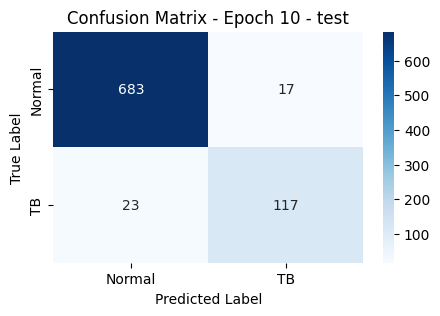

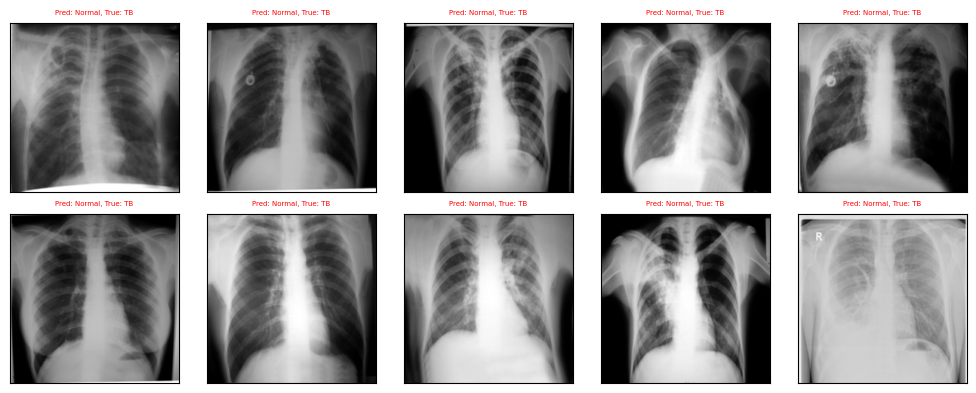

Running experiment with model: SimpleCNN With Dropout, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64,dropout_rate:0.2
Epoch [1/10], Train Loss: 0.3320, Val Loss: 0.1703, Train Accuracy: 86.50%, Val Accuracy: 94.20%
Epoch [2/10], Train Loss: 0.1850, Val Loss: 0.1273, Train Accuracy: 92.89%, Val Accuracy: 95.54%
Epoch [3/10], Train Loss: 0.1653, Val Loss: 0.1369, Train Accuracy: 93.45%, Val Accuracy: 95.24%
Epoch [4/10], Train Loss: 0.1260, Val Loss: 0.1170, Train Accuracy: 95.65%, Val Accuracy: 95.68%
Epoch [5/10], Train Loss: 0.1432, Val Loss: 0.1550, Train Accuracy: 94.61%, Val Accuracy: 94.20%
Epoch [6/10], Train Loss: 0.1312, Val Loss: 0.1498, Train Accuracy: 95.80%, Val Accuracy: 95.09%
Epoch [7/10], Train Loss: 0.0962, Val Loss: 0.0758, Train Accuracy: 96.76%, Val Accuracy: 97.02%
Epoch [8/10], Train Loss: 0.1110, Val Loss: 0.0933, Train Accuracy: 96.35%, Val Accuracy: 96.28%
Epoch [9/10], Train Loss: 0.0927, Val Loss: 0.1075, Train Accuracy: 96.35%, Val Accuracy: 96.58

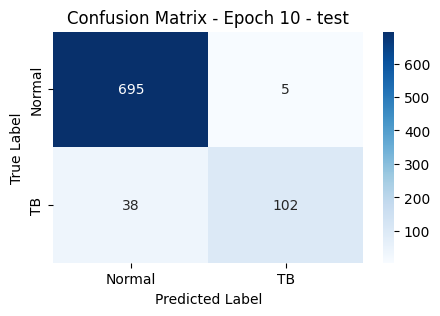

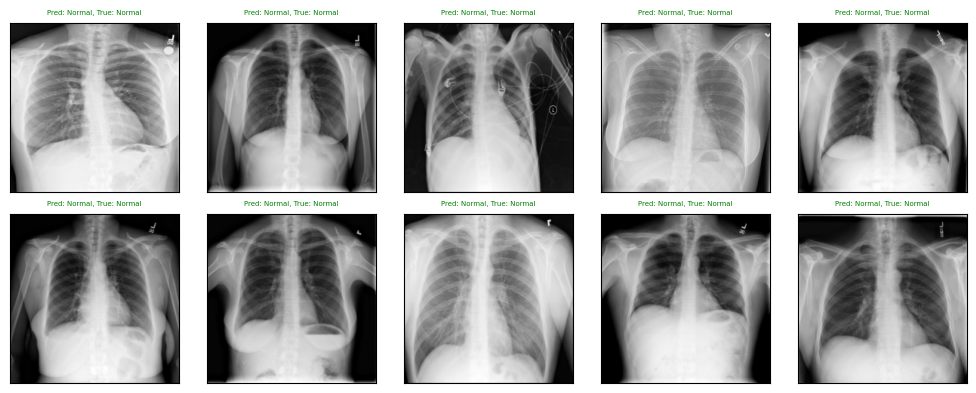

Running experiment with model: SimpleCNN With Dropout, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64,dropout_rate:0.3
Epoch [1/10], Train Loss: 0.3822, Val Loss: 0.2489, Train Accuracy: 84.30%, Val Accuracy: 91.52%
Epoch [2/10], Train Loss: 0.1823, Val Loss: 0.1445, Train Accuracy: 93.30%, Val Accuracy: 94.79%
Epoch [3/10], Train Loss: 0.1429, Val Loss: 0.1410, Train Accuracy: 94.79%, Val Accuracy: 95.24%
Epoch [4/10], Train Loss: 0.1357, Val Loss: 0.1216, Train Accuracy: 95.28%, Val Accuracy: 95.83%
Epoch [5/10], Train Loss: 0.1112, Val Loss: 0.1051, Train Accuracy: 96.02%, Val Accuracy: 96.43%
Epoch [6/10], Train Loss: 0.1024, Val Loss: 0.0767, Train Accuracy: 96.69%, Val Accuracy: 96.88%
Epoch [7/10], Train Loss: 0.1058, Val Loss: 0.0886, Train Accuracy: 96.35%, Val Accuracy: 96.73%
Epoch [8/10], Train Loss: 0.1045, Val Loss: 0.0813, Train Accuracy: 96.50%, Val Accuracy: 97.17%
Epoch [9/10], Train Loss: 0.0895, Val Loss: 0.1024, Train Accuracy: 97.14%, Val Accuracy: 96.28

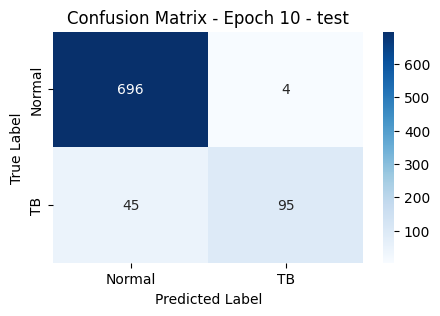

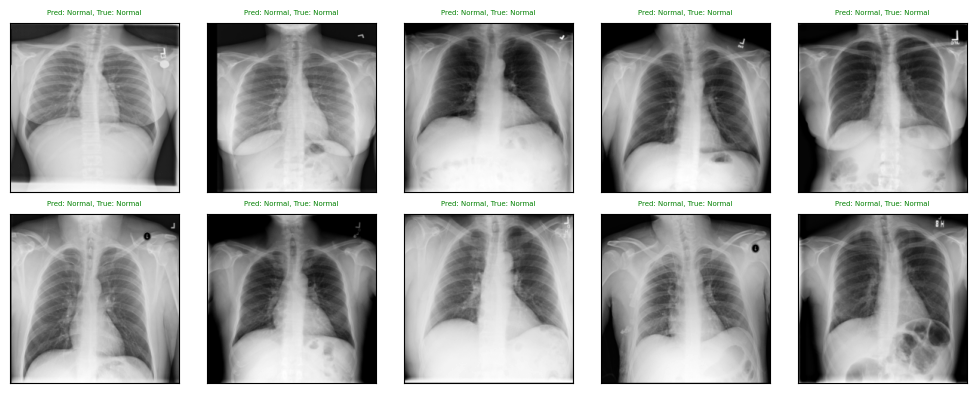

Running experiment with model: SimpleCNN With Dropout, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64,dropout_rate:0.5
Epoch [1/10], Train Loss: 0.3489, Val Loss: 0.2030, Train Accuracy: 84.38%, Val Accuracy: 93.30%
Epoch [2/10], Train Loss: 0.1965, Val Loss: 0.1805, Train Accuracy: 92.86%, Val Accuracy: 93.45%
Epoch [3/10], Train Loss: 0.1489, Val Loss: 0.1301, Train Accuracy: 94.90%, Val Accuracy: 95.98%
Epoch [4/10], Train Loss: 0.1414, Val Loss: 0.1126, Train Accuracy: 94.87%, Val Accuracy: 95.68%
Epoch [5/10], Train Loss: 0.1243, Val Loss: 0.1215, Train Accuracy: 96.02%, Val Accuracy: 95.24%
Epoch [6/10], Train Loss: 0.1163, Val Loss: 0.0929, Train Accuracy: 95.91%, Val Accuracy: 97.17%
Epoch [7/10], Train Loss: 0.1201, Val Loss: 0.0981, Train Accuracy: 96.02%, Val Accuracy: 95.68%
Epoch [8/10], Train Loss: 0.1009, Val Loss: 0.0779, Train Accuracy: 96.58%, Val Accuracy: 97.77%
Epoch [9/10], Train Loss: 0.0951, Val Loss: 0.0869, Train Accuracy: 96.95%, Val Accuracy: 97.92

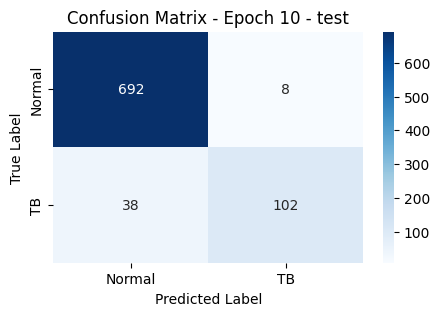

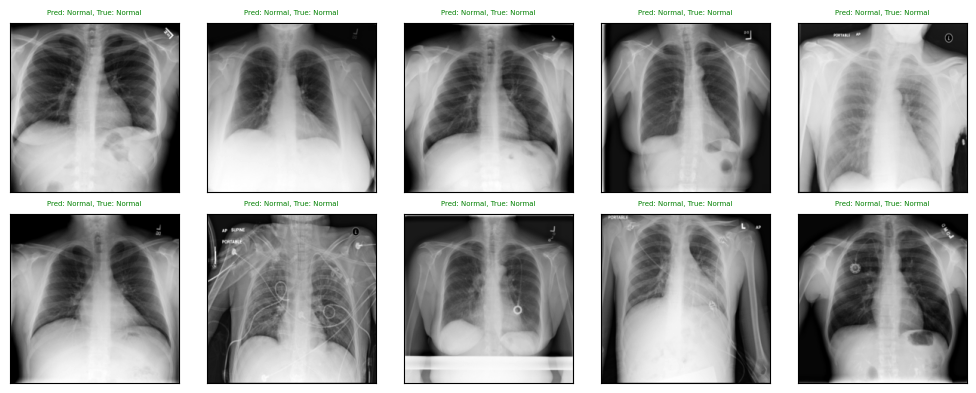

In [12]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 10
weight_decay=0
dropout_rates=[0.1,0.2,0.3,0.5]
lr=0.01

results_simpleCNN_Dropout=[]
for dropout_rate in dropout_rates:
    for opt_name, opt_class in optimizers:
            print(f'Running experiment with model: SimpleCNN With Dropout, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size},dropout_rate:{dropout_rate}')
            result = run_experiment(SimpleCNNwithDropout, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
            results_simpleCNN_Dropout.append(result)

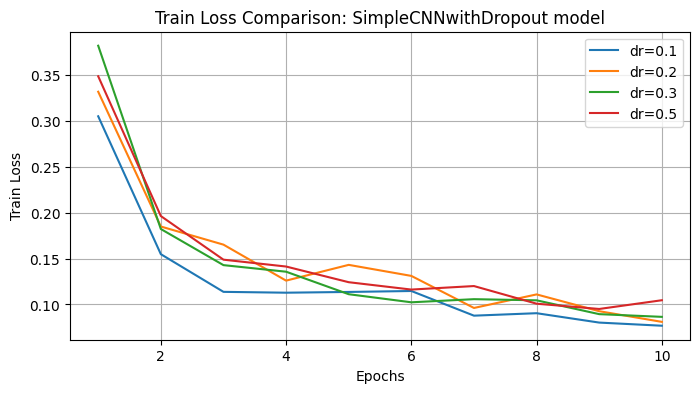

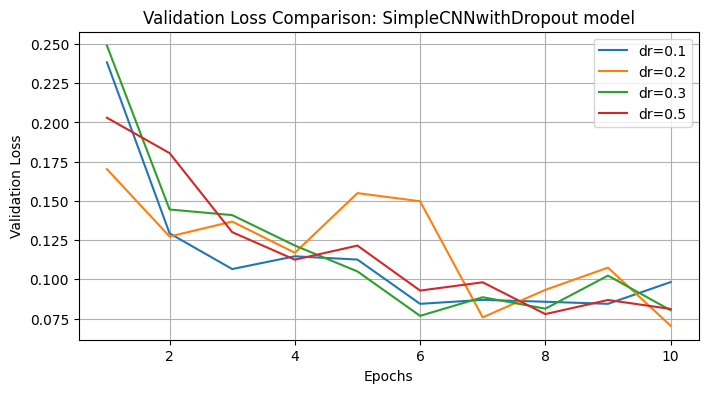

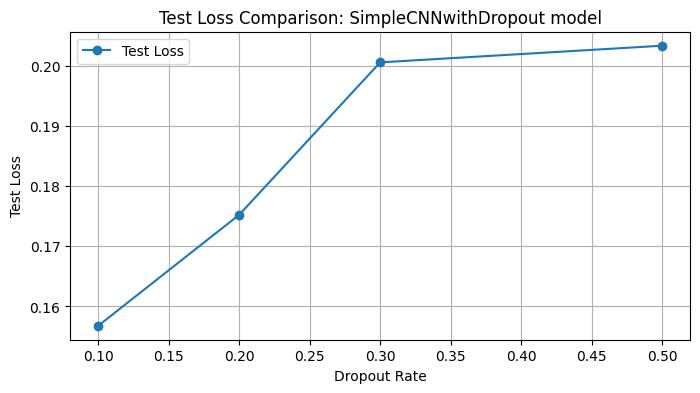

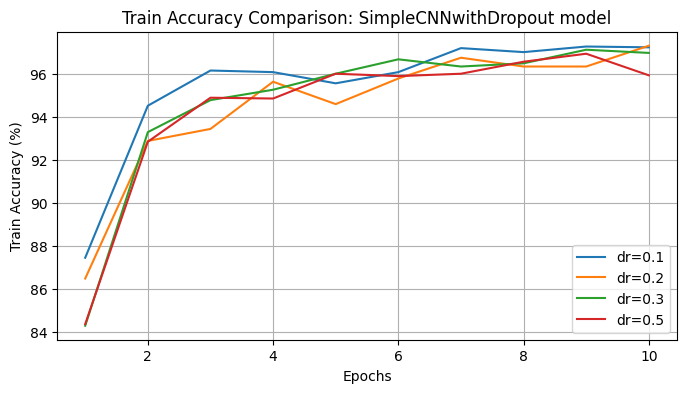

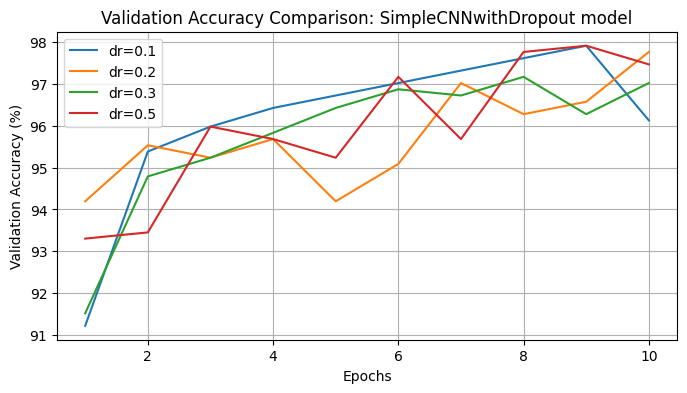

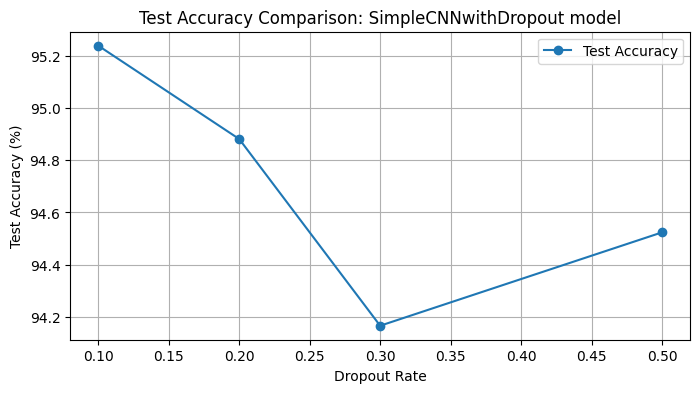

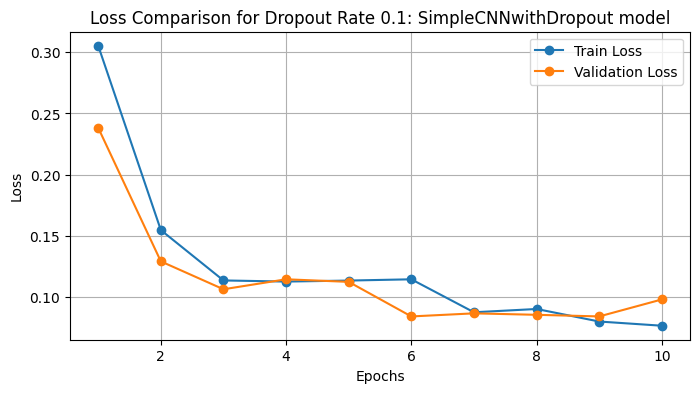

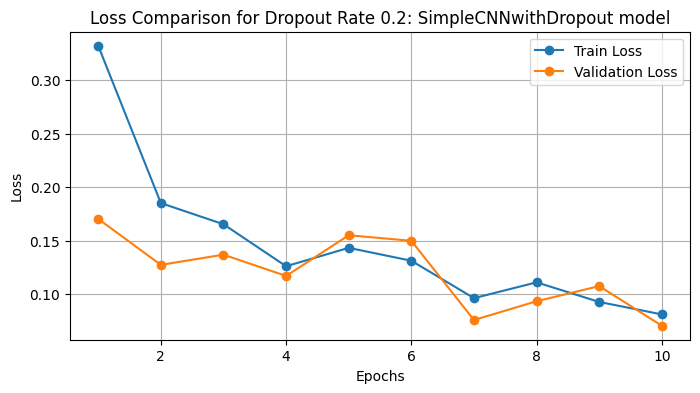

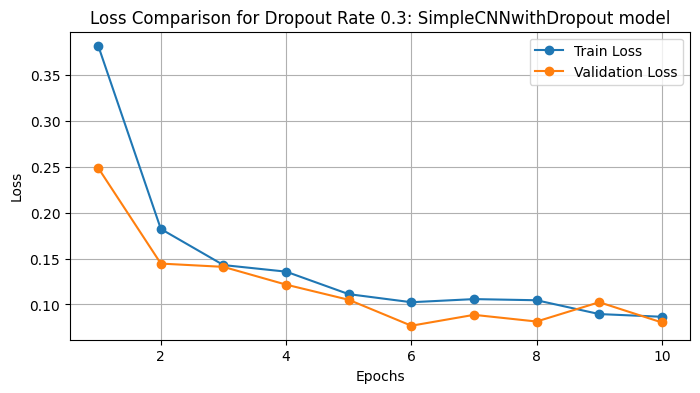

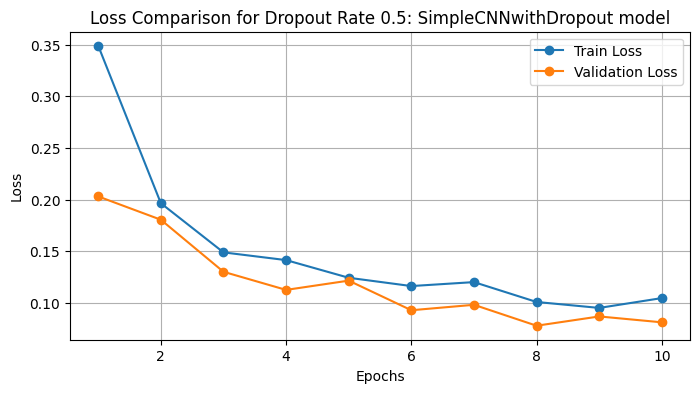

In [13]:
plot_dropout_results(results_simpleCNN_Dropout,SimpleCNNwithDropout)
plot_dropout_lossresults(results_simpleCNN_Dropout,SimpleCNNwithDropout)

# Experiment 5. Model performance with L2 regularization

In [14]:
def plot_weightdecay_results(results, model_class):
    weight_decays = [result['weight_decay'] for result in results]
    labels = [f"weight_decay={weight_decay}" for weight_decay in weight_decays]
    
    train_losses = [result['train_losses'] for result in results]
    val_losses = [result['val_losses'] for result in results]
    test_losses = [result['test_loss'] for result in results]
    
    train_accuracies = [result['train_accuracies'] for result in results]
    val_accuracies = [result['val_accuracies'] for result in results]
    test_accuracies = [result['test_accuracy'] for result in results]

    epochs = range(1, len(train_losses[0]) + 1)

    # Plot Train Loss
    plt.figure(figsize=(8, 4))
    for i, label in enumerate(labels):
        plt.plot(epochs, train_losses[i], label=label)
    plt.title(f'Train Loss Comparison: {model_class.__name__} model')
    plt.xlabel('Epochs')
    plt.ylabel('Train Loss')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # Plot Validation Loss
    plt.figure(figsize=(8, 4))
    for i, label in enumerate(labels):
        plt.plot(epochs, val_losses[i], label=label)
    plt.title(f'Validation Loss Comparison: {model_class.__name__} model')
    plt.xlabel('Epochs')
    plt.ylabel('Validation Loss')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # Plot Test Loss vs Dropout Rate
    plt.figure(figsize=(8, 4))
    plt.plot(weight_decays, test_losses, 'o-', label='Test Loss')
    plt.title(f'Test Loss Comparison: {model_class.__name__} model')
    plt.xlabel('weight_decay')
    plt.ylabel('Test Loss')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
    # Plot Train Accuracy
    plt.figure(figsize=(8, 4))
    for i, label in enumerate(labels):
        plt.plot(epochs, train_accuracies[i], label=label)
    plt.title(f'Train Accuracy Comparison: {model_class.__name__} model')
    plt.xlabel('Epochs')
    plt.ylabel('Train Accuracy (%)')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # Plot Validation Accuracy
    plt.figure(figsize=(8, 4))
    for i, label in enumerate(labels):
        plt.plot(epochs, val_accuracies[i], label=label)
    plt.title(f'Validation Accuracy Comparison: {model_class.__name__} model')
    plt.xlabel('Epochs')
    plt.ylabel('Validation Accuracy (%)')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()

    # Plot Test Accuracy vs Dropout Rate
    plt.figure(figsize=(8, 4))
    plt.plot(weight_decays, test_accuracies, 'o-', label='Test Accuracy')
    plt.title(f'Test Accuracy Comparison: {model_class.__name__} model')
    plt.xlabel('weight_decay')
    plt.ylabel('Test Accuracy (%)')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()
    
def plot_weightdecay_lossresults(results, model_class):
    weight_decays = [result['weight_decay'] for result in results]
    for i, result in enumerate(results):
        epochs = range(1, len(result['train_losses']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_losses'], marker='o', linestyle='-', label='Train Loss')
        plt.plot(epochs, result['val_losses'], marker='o', linestyle='-', label='Validation Loss')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Loss Comparison for weight deacay Rate {weight_decays[i]}: {model_class.__name__} model')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()

Running experiment with model: SimpleCNN With weight decay, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0.001
Epoch [1/10], Train Loss: 0.3226, Val Loss: 0.2260, Train Accuracy: 84.82%, Val Accuracy: 91.67%
Epoch [2/10], Train Loss: 0.1852, Val Loss: 0.1485, Train Accuracy: 92.52%, Val Accuracy: 95.83%
Epoch [3/10], Train Loss: 0.1136, Val Loss: 0.1177, Train Accuracy: 96.28%, Val Accuracy: 96.28%
Epoch [4/10], Train Loss: 0.1028, Val Loss: 0.1153, Train Accuracy: 96.28%, Val Accuracy: 95.98%
Epoch [5/10], Train Loss: 0.1024, Val Loss: 0.1633, Train Accuracy: 96.39%, Val Accuracy: 94.35%
Epoch [6/10], Train Loss: 0.1148, Val Loss: 0.1027, Train Accuracy: 96.47%, Val Accuracy: 97.02%
Epoch [7/10], Train Loss: 0.0715, Val Loss: 0.1030, Train Accuracy: 97.84%, Val Accuracy: 96.88%
Epoch [8/10], Train Loss: 0.0796, Val Loss: 0.0825, Train Accuracy: 97.43%, Val Accuracy: 97.47%
Epoch [9/10], Train Loss: 0.0678, Val Loss: 0.0788, Train Accuracy: 97.88%, Val Accura

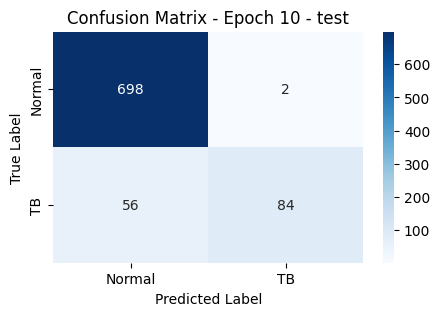

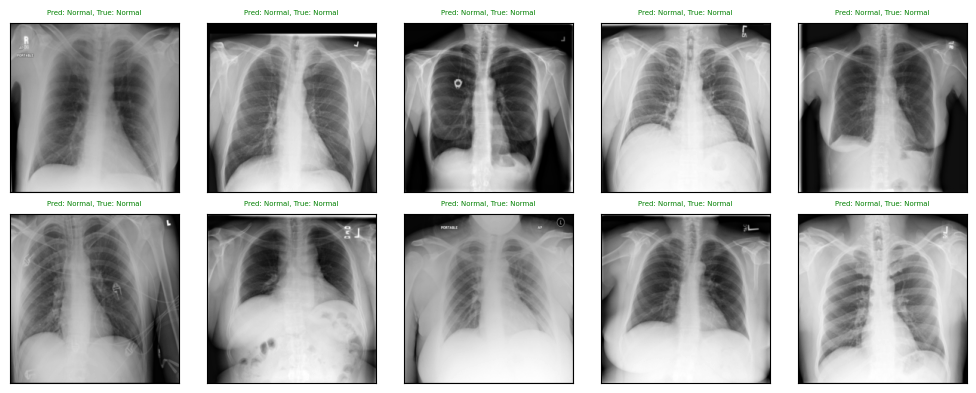

Running experiment with model: SimpleCNN With weight decay, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0.0001
Epoch [1/10], Train Loss: 0.3488, Val Loss: 0.1697, Train Accuracy: 85.79%, Val Accuracy: 92.86%
Epoch [2/10], Train Loss: 0.1625, Val Loss: 0.1249, Train Accuracy: 94.12%, Val Accuracy: 95.98%
Epoch [3/10], Train Loss: 0.1204, Val Loss: 0.1607, Train Accuracy: 95.46%, Val Accuracy: 94.05%
Epoch [4/10], Train Loss: 0.1169, Val Loss: 0.1224, Train Accuracy: 95.61%, Val Accuracy: 95.24%
Epoch [5/10], Train Loss: 0.1133, Val Loss: 0.0878, Train Accuracy: 95.94%, Val Accuracy: 96.88%
Epoch [6/10], Train Loss: 0.0848, Val Loss: 0.0881, Train Accuracy: 97.02%, Val Accuracy: 97.62%
Epoch [7/10], Train Loss: 0.0780, Val Loss: 0.0906, Train Accuracy: 97.36%, Val Accuracy: 96.73%
Epoch [8/10], Train Loss: 0.0705, Val Loss: 0.0821, Train Accuracy: 97.62%, Val Accuracy: 96.58%
Epoch [9/10], Train Loss: 0.0619, Val Loss: 0.1062, Train Accuracy: 97.84%, Val Accur

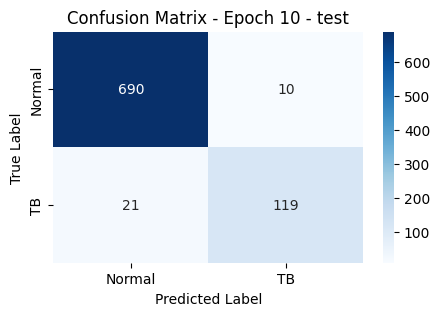

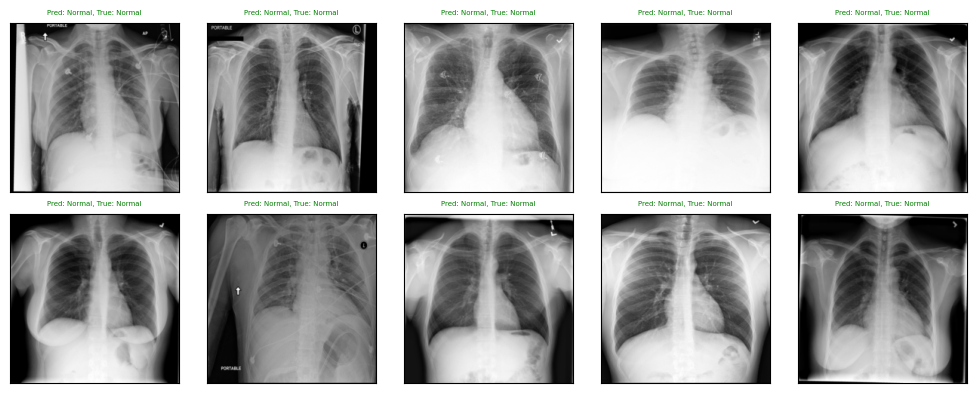

Running experiment with model: SimpleCNN With weight decay, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0.0005
Epoch [1/10], Train Loss: 0.3493, Val Loss: 0.2061, Train Accuracy: 84.11%, Val Accuracy: 91.52%
Epoch [2/10], Train Loss: 0.1879, Val Loss: 0.1492, Train Accuracy: 92.86%, Val Accuracy: 94.20%
Epoch [3/10], Train Loss: 0.1264, Val Loss: 0.1423, Train Accuracy: 96.02%, Val Accuracy: 93.15%
Epoch [4/10], Train Loss: 0.1168, Val Loss: 0.1143, Train Accuracy: 95.80%, Val Accuracy: 95.54%
Epoch [5/10], Train Loss: 0.1093, Val Loss: 0.0807, Train Accuracy: 96.39%, Val Accuracy: 96.88%
Epoch [6/10], Train Loss: 0.0933, Val Loss: 0.0967, Train Accuracy: 96.95%, Val Accuracy: 97.02%
Epoch [7/10], Train Loss: 0.1028, Val Loss: 0.0770, Train Accuracy: 96.58%, Val Accuracy: 97.17%
Epoch [8/10], Train Loss: 0.0928, Val Loss: 0.0741, Train Accuracy: 96.99%, Val Accuracy: 97.02%
Epoch [9/10], Train Loss: 0.0820, Val Loss: 0.0857, Train Accuracy: 97.25%, Val Accur

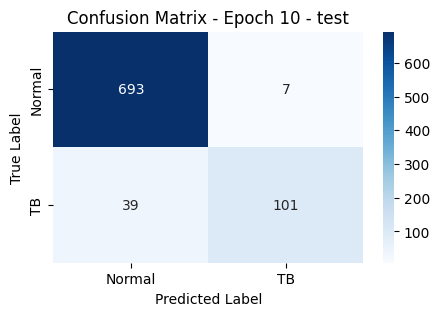

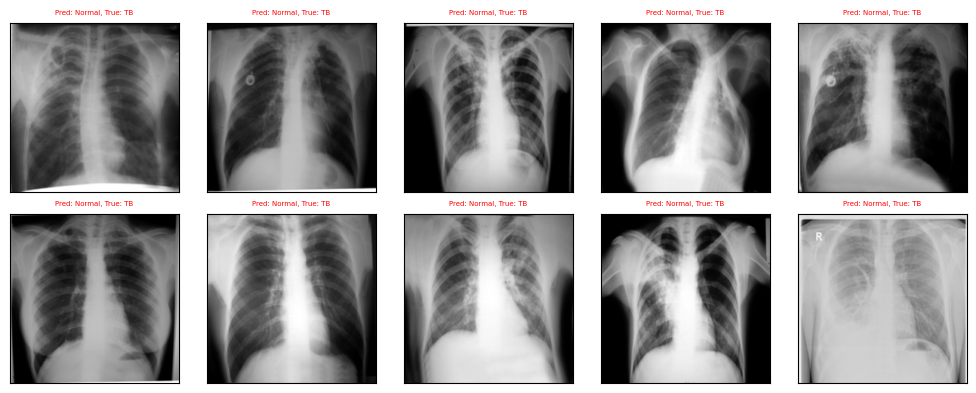

In [15]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 10
weight_decays=[0.001,0.0001,0.0005]
dropout_rate=0
lr=0.01

results_simpleCNN_weightdecay=[]

for weight_decay in weight_decays:
    for opt_name, opt_class in optimizers:
            print(f'Running experiment with model: SimpleCNN With weight decay, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
            result = run_experiment(SimpleCNN, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
            results_simpleCNN_weightdecay.append(result)

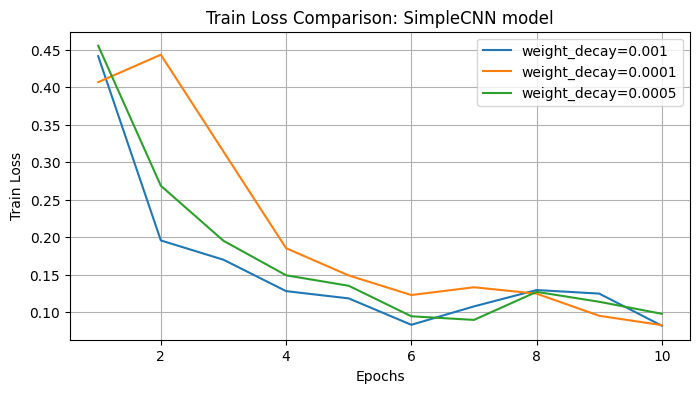

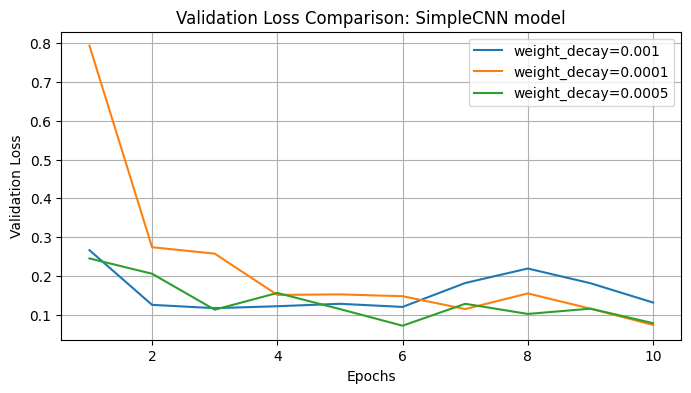

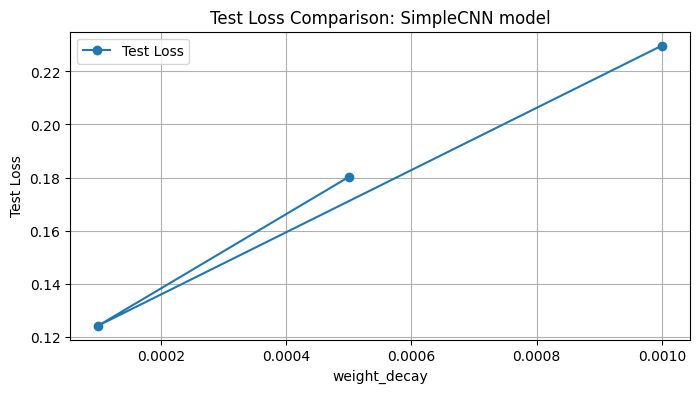

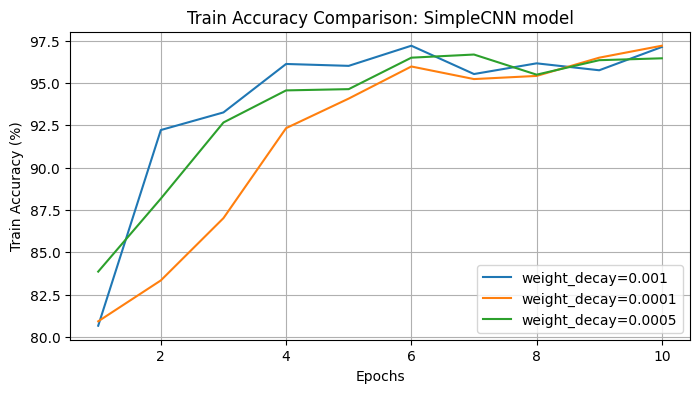

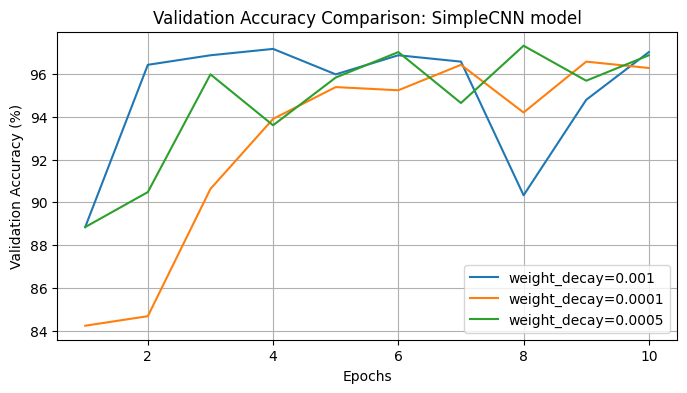

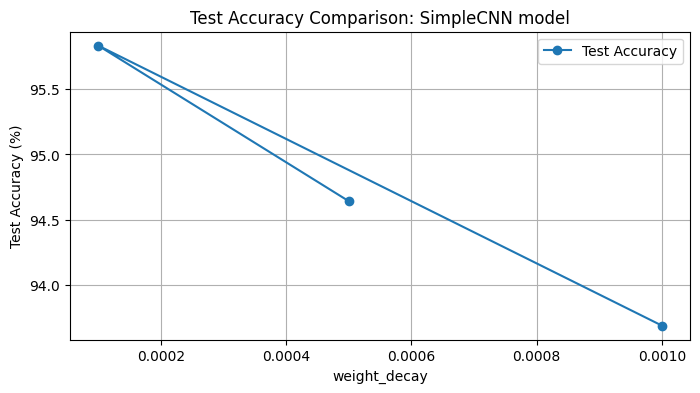

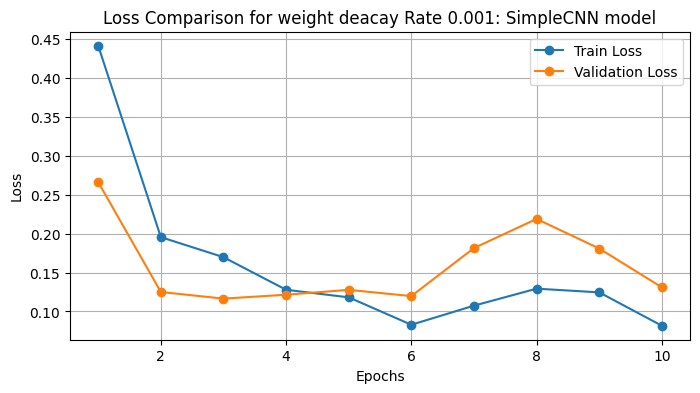

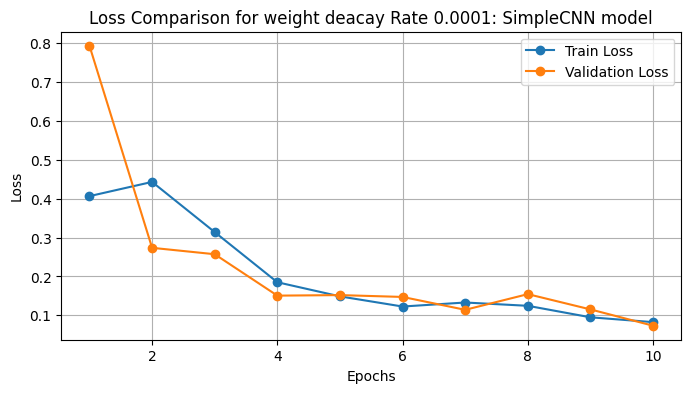

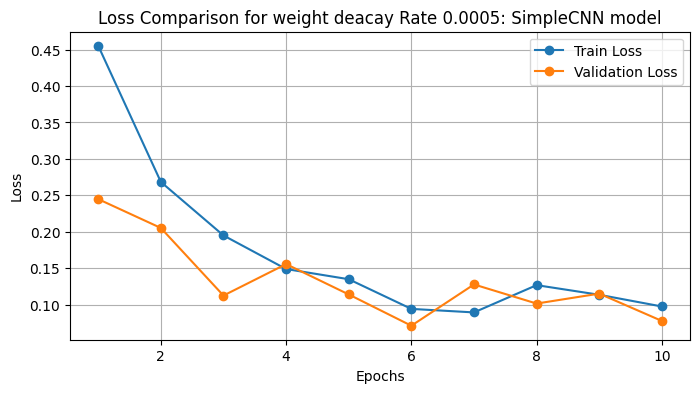

In [18]:
plot_weightdecay_results(results_simpleCNN_weightdecay,SimpleCNN)
plot_weightdecay_lossresults(results_simpleCNN_weightdecay,SimpleCNN)

# Experiment with ResNet18

In [19]:
def plot_Resnetresults(results, model_class):
    optimizers = [result['optimizer'] for result in results]
    for i, result in enumerate(results):
        epochs = range(1, len(result['train_losses']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_losses'], marker='o', linestyle='-', label='Train Loss')
        plt.plot(epochs, result['val_losses'], marker='o', linestyle='-', label='Validation Loss')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Loss Comparison for : {model_class.__name__} model with {optimizers}')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()
   
    for i, result in enumerate(results):
        epochs = range(1, len(result['train_accuracies']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_accuracies'], marker='o', linestyle='-', label='Train accuracy')
        plt.plot(epochs, result['val_accuracies'], marker='o', linestyle='-', label='Validation accuracy')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'accuracy Comparison for : {model_class.__name__} model with {optimizers}')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()

Running experiment with model: SimpleCNN With weight decay, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0


C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/10], Train Loss: 0.1602, Val Loss: 0.0951, Train Accuracy: 94.27%, Val Accuracy: 95.98%
Epoch [2/10], Train Loss: 0.0460, Val Loss: 0.1808, Train Accuracy: 98.59%, Val Accuracy: 92.56%
Epoch [3/10], Train Loss: 0.0446, Val Loss: 0.0327, Train Accuracy: 98.40%, Val Accuracy: 98.96%
Epoch [4/10], Train Loss: 0.0249, Val Loss: 0.0470, Train Accuracy: 99.11%, Val Accuracy: 98.96%
Epoch [5/10], Train Loss: 0.0133, Val Loss: 0.0389, Train Accuracy: 99.55%, Val Accuracy: 98.81%
Epoch [6/10], Train Loss: 0.0110, Val Loss: 0.0202, Train Accuracy: 99.59%, Val Accuracy: 99.26%
Epoch [7/10], Train Loss: 0.0070, Val Loss: 0.0106, Train Accuracy: 99.67%, Val Accuracy: 99.55%
Epoch [8/10], Train Loss: 0.0032, Val Loss: 0.0154, Train Accuracy: 99.96%, Val Accuracy: 99.11%
Epoch [9/10], Train Loss: 0.0011, Val Loss: 0.0066, Train Accuracy: 100.00%, Val Accuracy: 99.70%
Epoch [10/10], Train Loss: 0.0010, Val Loss: 0.0201, Train Accuracy: 100.00%, Val Accuracy: 99.40%
Test Loss: 0.0093, Test Acc

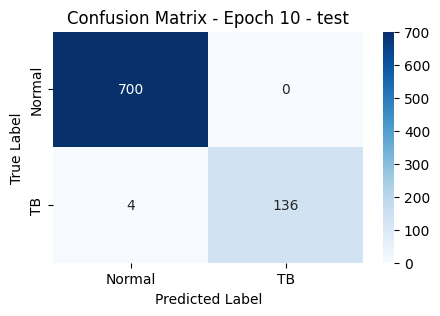

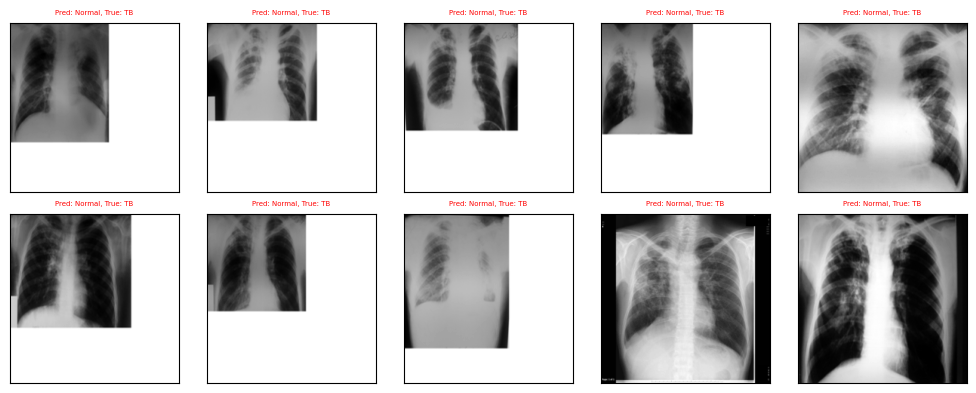

In [17]:
optimizers = [
    ('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 10
weight_decays=0
dropout_rates=0
lr=0.01

results_ResNet18_momentum=[]

for opt_name, opt_class in optimizers:
    print(f'Running experiment with model: SimpleCNN With weight decay, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
    result = run_experiment(ResNet18, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
    results_ResNet18_momentum.append(result)

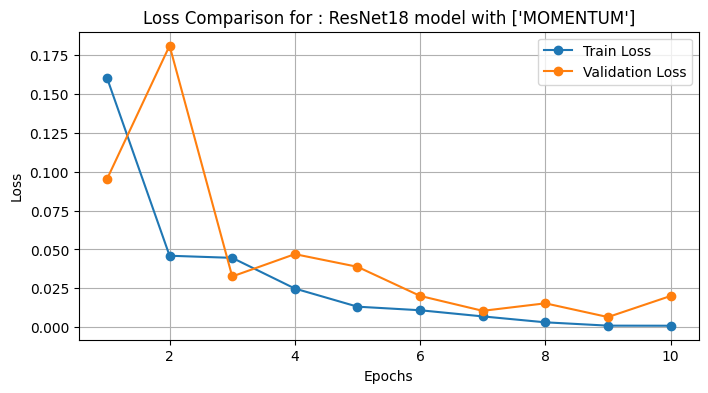

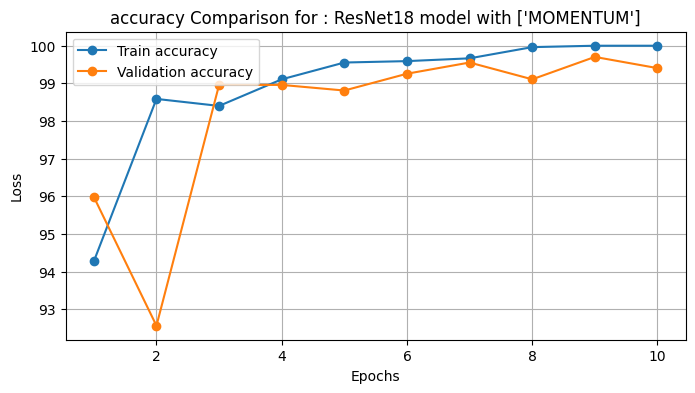

In [20]:
plot_Resnetresults(results_ResNet18_momentum,ResNet18)

Experiment with Adam optimizer

In [ ]:
optimizers = [
     ('Adam', optim.Adam),]
batch_size = 64
num_epochs = 10
weight_decays=0
dropout_rates=0
lr=0.01

results_ResNet18=[]

for opt_name, opt_class in optimizers:
    print(f'Running experiment with model: SimpleCNN With weight decay, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
    result = run_experiment(ResNet18, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
    results_ResNet18.append(result)

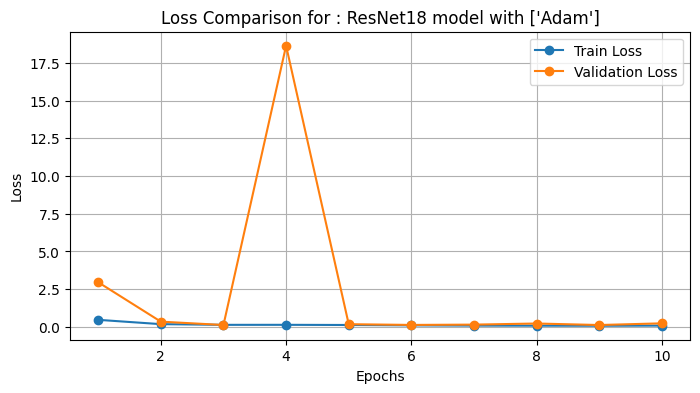

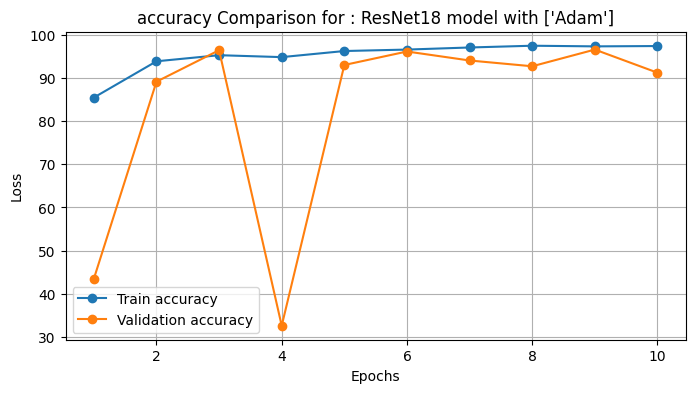

In [22]:
plot_Resnetresults(results_ResNet18,ResNet18)

# Experiment 6. dropout with Resnet18 model

# Experiment 6a. dropout rate 0.2

Running experiment with model: RestNet18 With Dropout, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64,dropout_rate:0.2


C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/5], Train Loss: 0.3938, Val Loss: 0.2106, Train Accuracy: 87.17%, Val Accuracy: 91.96%
Epoch [2/5], Train Loss: 0.1905, Val Loss: 0.0827, Train Accuracy: 95.31%, Val Accuracy: 97.92%
Epoch [3/5], Train Loss: 0.1842, Val Loss: 0.0418, Train Accuracy: 95.42%, Val Accuracy: 98.66%
Epoch [4/5], Train Loss: 0.1515, Val Loss: 0.0315, Train Accuracy: 96.43%, Val Accuracy: 99.11%
Epoch [5/5], Train Loss: 0.1505, Val Loss: 0.0354, Train Accuracy: 95.98%, Val Accuracy: 99.26%
Test Loss: 0.0557, Test Accuracy: 97.98%


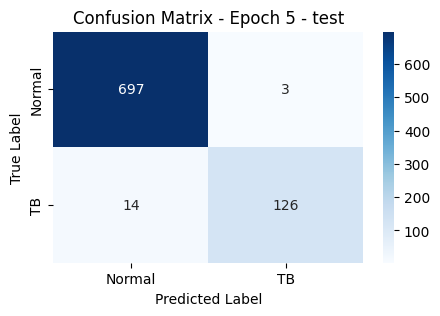

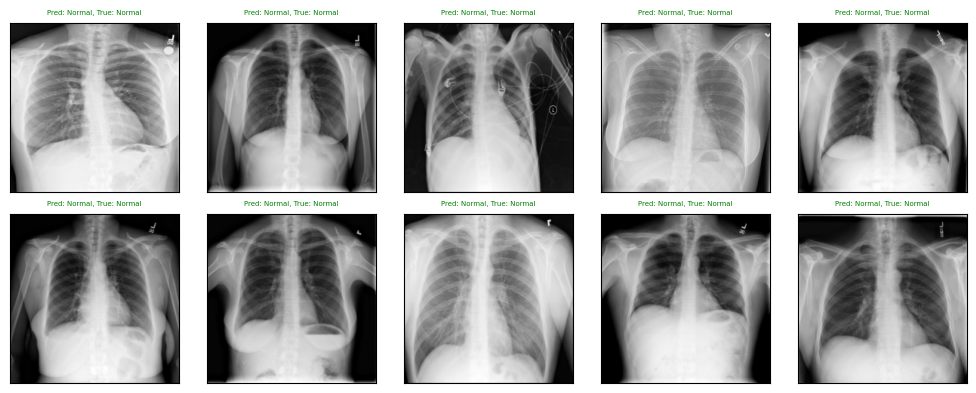

In [31]:
optimizers = [
    ('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decay=0
dropout_rate= 0.2
lr=0.01
results_resnet_Dropout=[]

for opt_name, opt_class in optimizers:
        print(f'Running experiment with model: RestNet18 With Dropout, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size},dropout_rate:{dropout_rate}')
        result = run_experiment(ResNet18withDropout, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
        results_resnet_Dropout.append(result)

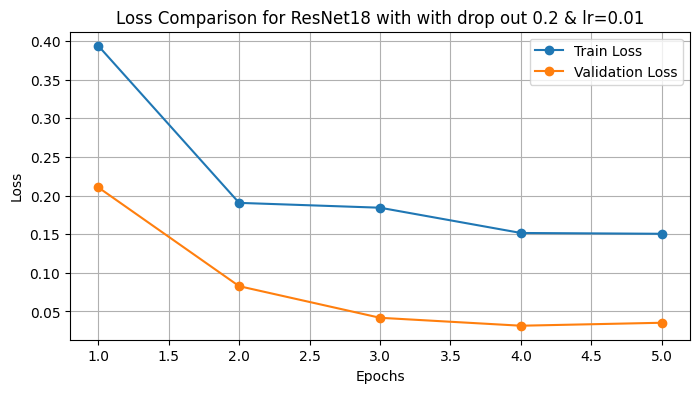

In [32]:
for i, result in enumerate(results_resnet_Dropout):
        epochs = range(1, len(result['train_losses']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_losses'], marker='o', linestyle='-', label='Train Loss')
        plt.plot(epochs, result['val_losses'], marker='o', linestyle='-', label='Validation Loss')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Loss Comparison for ResNet18 with with drop out 0.2 & lr=0.01')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()


# Experiment 6b. dropout rate 0.2

Running experiment with model: RestNet18 With Dropout, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64,dropout_rate:0.3


C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/5], Train Loss: 0.3647, Val Loss: 0.2630, Train Accuracy: 88.84%, Val Accuracy: 93.30%
Epoch [2/5], Train Loss: 0.2566, Val Loss: 0.1012, Train Accuracy: 93.53%, Val Accuracy: 95.98%
Epoch [3/5], Train Loss: 0.2432, Val Loss: 0.1010, Train Accuracy: 94.12%, Val Accuracy: 97.92%
Epoch [4/5], Train Loss: 0.2237, Val Loss: 0.0410, Train Accuracy: 94.35%, Val Accuracy: 98.96%
Epoch [5/5], Train Loss: 0.2138, Val Loss: 0.0446, Train Accuracy: 94.20%, Val Accuracy: 98.96%
Test Loss: 0.0353, Test Accuracy: 98.81%


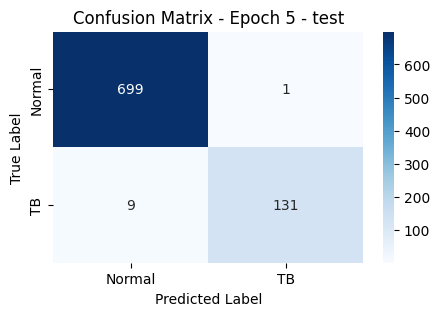

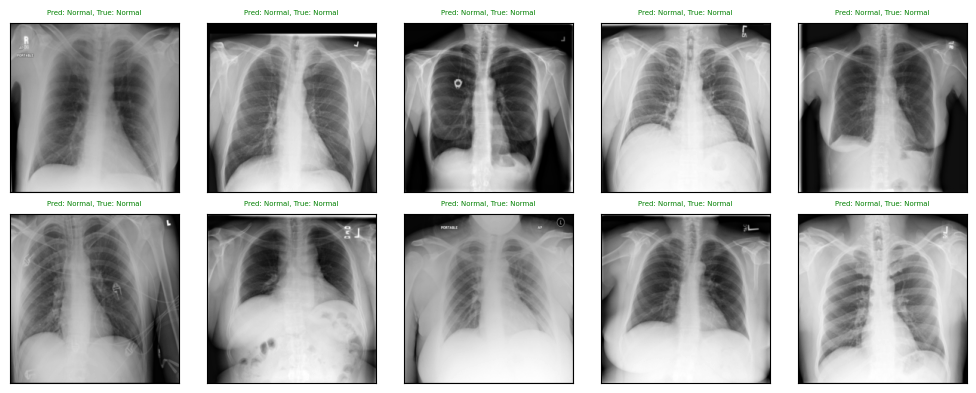

In [33]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decay=0
dropout_rate= 0.3
lr=0.01
results_resnet_Dropout_03=[]

for opt_name, opt_class in optimizers:
        print(f'Running experiment with model: RestNet18 With Dropout, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size},dropout_rate:{dropout_rate}')
        result = run_experiment(ResNet18withDropout, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
        results_resnet_Dropout_03.append(result)

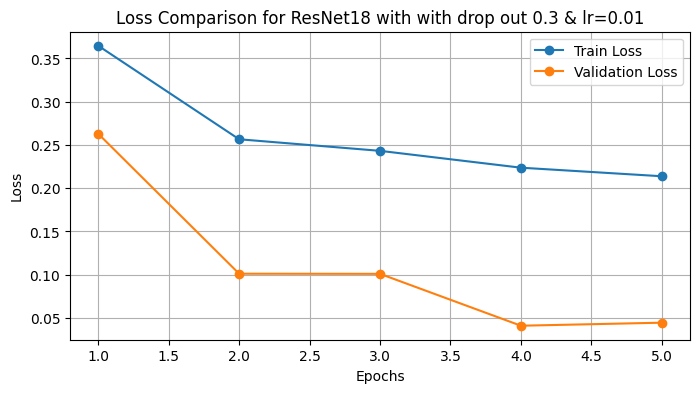

In [35]:
for i, result in enumerate(results_resnet_Dropout_03):
        epochs = range(1, len(result['train_losses']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_losses'], marker='o', linestyle='-', label='Train Loss')
        plt.plot(epochs, result['val_losses'], marker='o', linestyle='-', label='Validation Loss')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Loss Comparison for ResNet18 with with drop out 0.3 & lr=0.01')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()


# Experiment 6c. dropout rate 0.1


Running experiment with model: RestNet18 With Dropout, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64,dropout_rate:0.1


C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/5], Train Loss: 0.2136, Val Loss: 0.0993, Train Accuracy: 92.52%, Val Accuracy: 96.28%
Epoch [2/5], Train Loss: 0.1205, Val Loss: 0.0245, Train Accuracy: 96.54%, Val Accuracy: 99.40%
Epoch [3/5], Train Loss: 0.0973, Val Loss: 0.0239, Train Accuracy: 97.47%, Val Accuracy: 99.55%
Epoch [4/5], Train Loss: 0.0861, Val Loss: 0.0576, Train Accuracy: 97.32%, Val Accuracy: 97.77%
Epoch [5/5], Train Loss: 0.0821, Val Loss: 0.0149, Train Accuracy: 97.92%, Val Accuracy: 99.55%
Test Loss: 0.0274, Test Accuracy: 99.29%


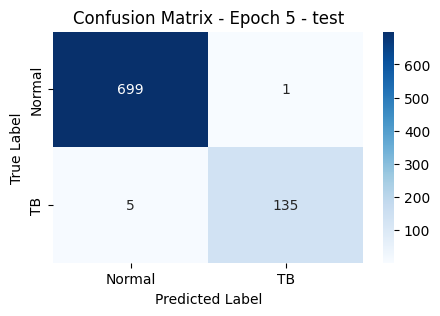

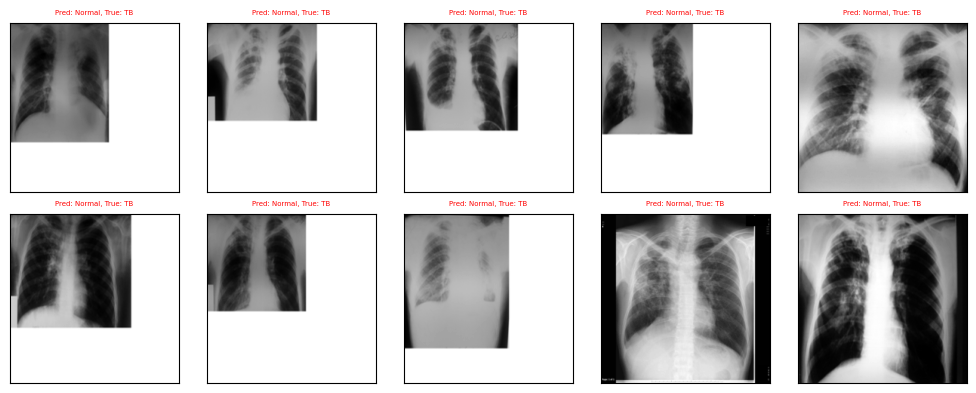

In [13]:
optimizers = [
    ('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decay=0
dropout_rate= 0.1
lr=0.01
results_resnet_Dropout_05=[]

for opt_name, opt_class in optimizers:
        print(f'Running experiment with model: RestNet18 With Dropout, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size},dropout_rate:{dropout_rate}')
        result = run_experiment(ResNet18withDropout, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
        results_resnet_Dropout_05.append(result)

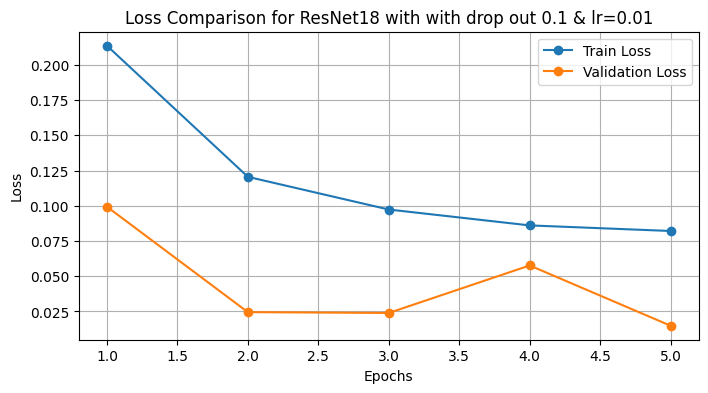

In [14]:
for i, result in enumerate(results_resnet_Dropout_05):
        epochs = range(1, len(result['train_losses']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_losses'], marker='o', linestyle='-', label='Train Loss')
        plt.plot(epochs, result['val_losses'], marker='o', linestyle='-', label='Validation Loss')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Loss Comparison for ResNet18 with with drop out 0.1 & lr=0.01')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()


# Experiment 7. ResNet with Weight Decay(L2 Regularization)

# Experiment 7a. ResNet with Weight Decay 0.0005

Running experiment with model: SimpleCNN With weight decay, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0.0005


C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/5], Train Loss: 0.1513, Val Loss: 0.1472, Train Accuracy: 94.49%, Val Accuracy: 95.24%
Epoch [2/5], Train Loss: 0.0648, Val Loss: 0.0998, Train Accuracy: 98.10%, Val Accuracy: 96.28%
Epoch [3/5], Train Loss: 0.0388, Val Loss: 0.1059, Train Accuracy: 98.70%, Val Accuracy: 95.98%
Epoch [4/5], Train Loss: 0.0200, Val Loss: 0.0259, Train Accuracy: 99.29%, Val Accuracy: 99.40%
Epoch [5/5], Train Loss: 0.0152, Val Loss: 0.0350, Train Accuracy: 99.52%, Val Accuracy: 98.81%
Test Loss: 0.0249, Test Accuracy: 98.93%


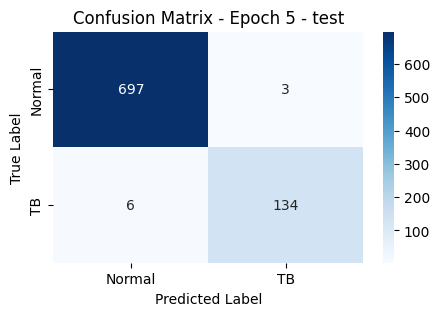

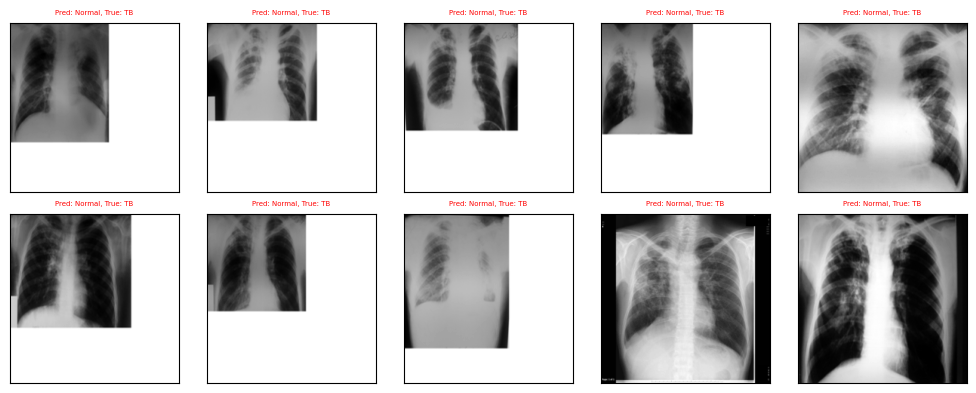

In [25]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decay=0.0005
dropout_rate=0
lr=0.01

results_ResNet18_weightreg=[]
for opt_name, opt_class in optimizers:
    print(f'Running experiment with model: SimpleCNN With weight decay, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
    result = run_experiment(ResNet18, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
    results_ResNet18_weightreg.append(result)

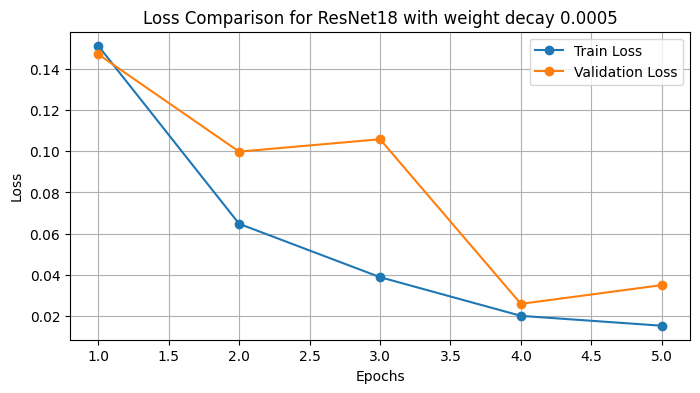

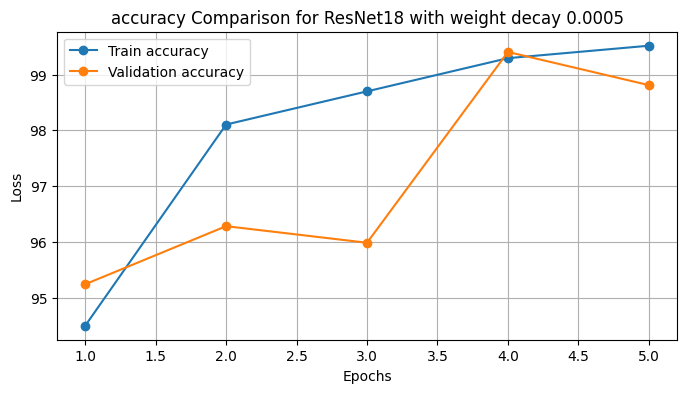

In [27]:
for i, result in enumerate(results_ResNet18_weightreg):
        epochs = range(1, len(result['train_losses']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_losses'], marker='o', linestyle='-', label='Train Loss')
        plt.plot(epochs, result['val_losses'], marker='o', linestyle='-', label='Validation Loss')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Loss Comparison for ResNet18 with weight decay 0.0005')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()
        
for i, result in enumerate(results_ResNet18_weightreg):
        epochs = range(1, len(result['train_accuracies']) + 1)
        
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_accuracies'], marker='o', linestyle='-', label='Train accuracy')
        plt.plot(epochs, result['val_accuracies'], marker='o', linestyle='-', label='Validation accuracy')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'accuracy Comparison for ResNet18 with weight decay 0.0005')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()

# Experiment 7b. ResNet with Weight Decay 0.0001

Running experiment with model: SimpleCNN With weight decay, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0.0001


C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/5], Train Loss: 0.1846, Val Loss: 0.1778, Train Accuracy: 92.89%, Val Accuracy: 93.60%
Epoch [2/5], Train Loss: 0.0545, Val Loss: 0.1654, Train Accuracy: 98.14%, Val Accuracy: 92.56%
Epoch [3/5], Train Loss: 0.0434, Val Loss: 0.0795, Train Accuracy: 98.40%, Val Accuracy: 96.58%
Epoch [4/5], Train Loss: 0.0159, Val Loss: 0.0506, Train Accuracy: 99.63%, Val Accuracy: 98.51%
Epoch [5/5], Train Loss: 0.0320, Val Loss: 0.0389, Train Accuracy: 98.96%, Val Accuracy: 98.96%
Test Loss: 0.0307, Test Accuracy: 98.81%


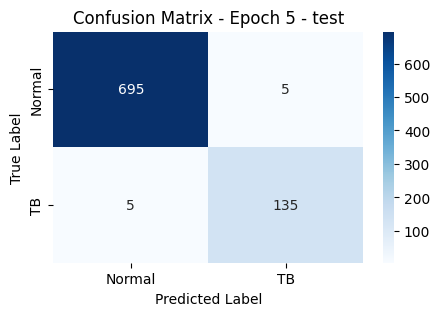

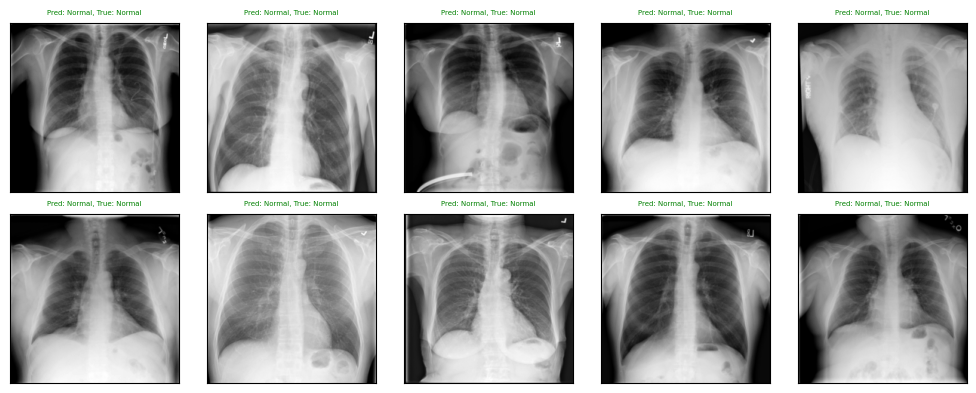

In [28]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decay=0.0001
dropout_rate=0
lr=0.01

results_ResNet18_weightreg=[]

for opt_name, opt_class in optimizers:
    print(f'Running experiment with model: SimpleCNN With weight decay, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
    result = run_experiment(ResNet18, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
    results_ResNet18_weightreg.append(result)

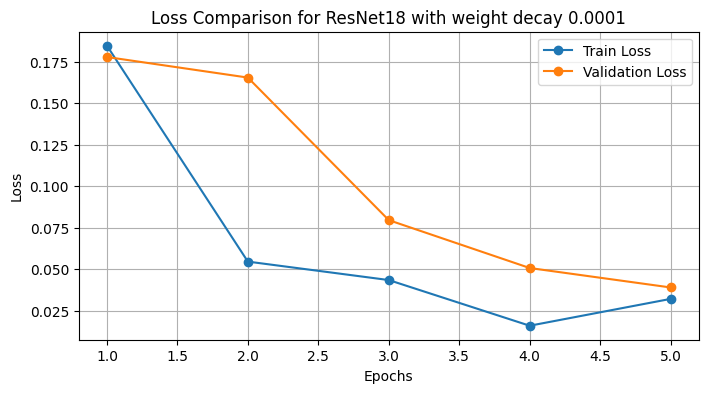

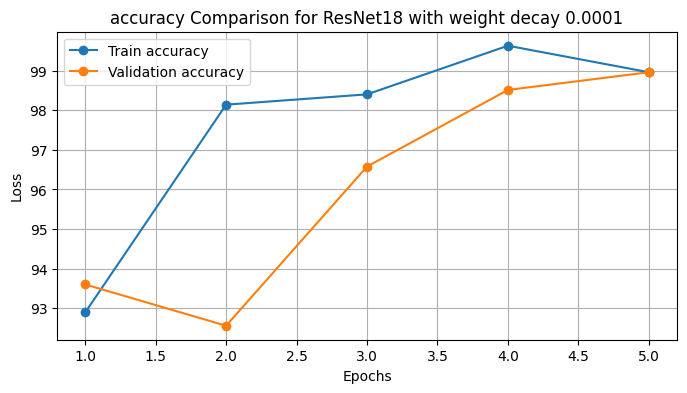

In [30]:
for i, result in enumerate(results_ResNet18_weightreg):
        epochs = range(1, len(result['train_losses']) + 1)
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_losses'], marker='o', linestyle='-', label='Train Loss')
        plt.plot(epochs, result['val_losses'], marker='o', linestyle='-', label='Validation Loss')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Loss Comparison for ResNet18 with weight decay 0.0001')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()
        
for i, result in enumerate(results_ResNet18_weightreg):
        epochs = range(1, len(result['train_accuracies']) + 1)   
        plt.figure(figsize=(8, 4))
        plt.plot(epochs, result['train_accuracies'], marker='o', linestyle='-', label='Train accuracy')
        plt.plot(epochs, result['val_accuracies'], marker='o', linestyle='-', label='Validation accuracy')
        
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'accuracy Comparison for ResNet18 with weight decay 0.0001')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()

# Experiment 8. SimpleCNN and ResNet18 Model Comaprision

Running experiment with model: CNN for comparision, optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0
Epoch [1/5], Train Loss: 0.3364, Val Loss: 0.2110, Train Accuracy: 86.50%, Val Accuracy: 92.86%
Epoch [2/5], Train Loss: 0.1831, Val Loss: 0.1630, Train Accuracy: 93.15%, Val Accuracy: 93.15%
Epoch [3/5], Train Loss: 0.1243, Val Loss: 0.1291, Train Accuracy: 95.50%, Val Accuracy: 95.09%
Epoch [4/5], Train Loss: 0.1010, Val Loss: 0.0972, Train Accuracy: 96.43%, Val Accuracy: 96.58%
Epoch [5/5], Train Loss: 0.0976, Val Loss: 0.1035, Train Accuracy: 97.25%, Val Accuracy: 96.28%
Test Loss: 0.3211, Test Accuracy: 93.33%


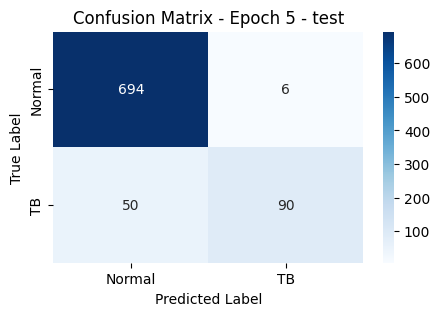

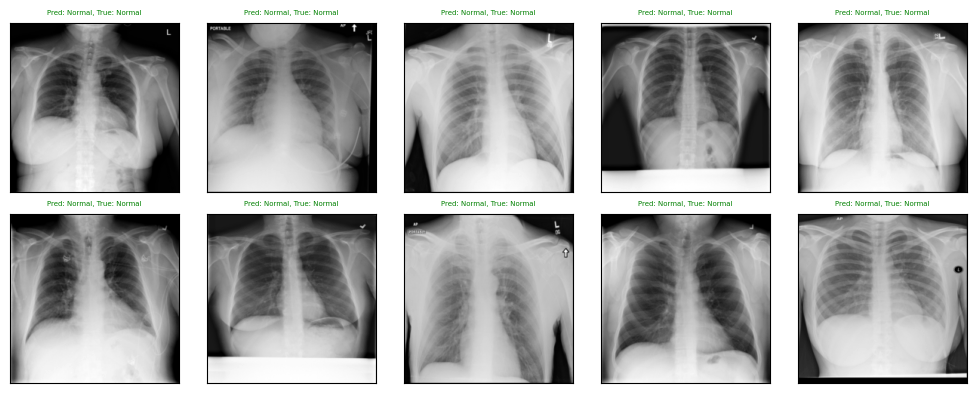

In [36]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decays=0
dropout_rates=0
lr=0.01

CNN_comparision=[]

for opt_name, opt_class in optimizers:
    print(f'Running experiment with model: CNN for comparision, optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
    result = run_experiment(SimpleCNN, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
    CNN_comparision.append(result)

Running experiment with model: ResNet18 for comparision, with optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0


C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/5], Train Loss: 0.1663, Val Loss: 0.0737, Train Accuracy: 93.71%, Val Accuracy: 97.77%
Epoch [2/5], Train Loss: 0.0440, Val Loss: 0.0945, Train Accuracy: 98.47%, Val Accuracy: 97.47%
Epoch [3/5], Train Loss: 0.0342, Val Loss: 0.1142, Train Accuracy: 99.18%, Val Accuracy: 95.98%
Epoch [4/5], Train Loss: 0.0192, Val Loss: 0.0235, Train Accuracy: 99.18%, Val Accuracy: 98.96%
Epoch [5/5], Train Loss: 0.0135, Val Loss: 0.0449, Train Accuracy: 99.59%, Val Accuracy: 98.66%
Test Loss: 0.0559, Test Accuracy: 97.74%


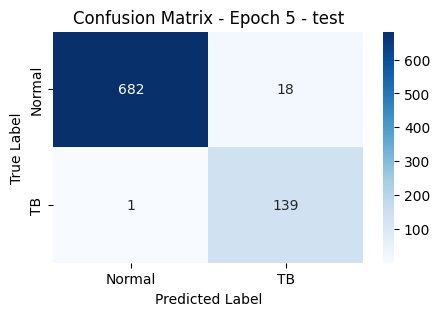

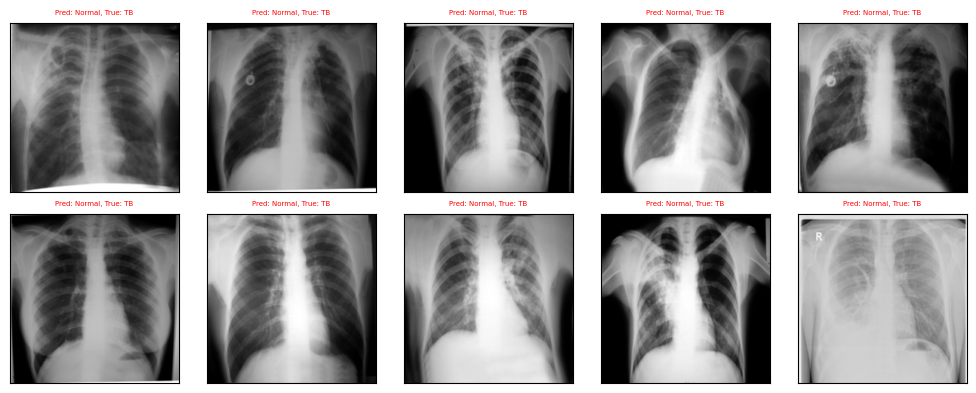

In [37]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decays=0
dropout_rates=0
lr=0.01

Resnet18_comparision=[]

for opt_name, opt_class in optimizers:
    print(f'Running experiment with model: ResNet18 for comparision, with optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
    result = run_experiment(ResNet18, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)
    Resnet18_comparision.append(result)

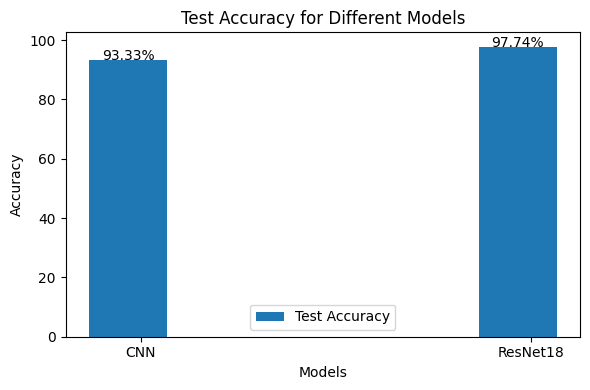

In [41]:
models = ['CNN', 'ResNet18',]
test_accuracies = [
    CNN_comparision[0]['test_accuracy'],
    Resnet18_comparision[0]['test_accuracy']]
x = np.arange(len(models))
width = 0.20# width of the bars
fig, ax = plt.subplots(figsize=(6, 4))
bars = ax.bar(x - width/6, test_accuracies, width, label='Test Accuracy')
ax.set_xlabel('Models')
ax.set_ylabel('Accuracy')
ax.set_title('Test Accuracy for Different Models')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}%',
                    xy=(bar.get_x() + bar.get_width() / 2, height), 
                    ha='center')
add_labels(bars)
plt.tight_layout()
plt.show()

# Experiment 9. Random Image prediction with simpleCNN and ResNet18

In [109]:
def predict_images(model, image_dir, class_names, num_images=10):
    model.eval()  
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    sampled_files = random.sample(image_files, min(num_images, len(image_files)))
    
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5], std=[0.5])])
    
    fig = plt.figure(figsize=(10, 4))
    for idx, image_name in enumerate(sampled_files):
        image_path = os.path.join(image_dir, image_name)
        image = Image.open(image_path).convert('L')  # Convert to grayscale
        image_tensor = transform(image).unsqueeze(0)  # Add batch dimension
        output = model(image_tensor)
        predicted_prob = torch.sigmoid(output).item()
        predicted_class = class_names[1] if predicted_prob > 0.5 else class_names[0]
        true_label = 'Normal'if'Normal'in image_name else'TB'
        img = image_tensor.squeeze(0).cpu().numpy().transpose((1, 2, 0))
        img = (img * 0.5) + 0.5
        img = img.squeeze(-1)
        
        ax = fig.add_subplot(2, num_images // 2, idx + 1, xticks=[], yticks=[])
        plt.imshow(img, cmap='gray')
        ax.set_title(f"True: {true_label},Pred: {predicted_class}", fontsize=5)
    
    plt.show()

In [105]:
def run_experiment_Imgpred(model_class, opt_class, opt_name, lr, batch_size, num_epochs, weight_decay, dropout_rate):
    traindataloader, valdataloader, testdataloader = dataload(batch_size)

    if'Dropout'in model_class.__name__:
        model = model_class(dropout_rate=dropout_rate)
    else:
        model = model_class()
        
    if opt_name == 'MOMENTUM':
        optimizer = opt_class(model.parameters(), lr=lr, weight_decay=weight_decay, momentum=0.9)
    else:
        optimizer = opt_class(model.parameters(), lr=lr, weight_decay=weight_decay)
    
    criterion = nn.BCELoss()

    train_losses = []
    val_losses = []
    test_losses=[]
    train_accuracies=[]
    val_accuracies=[]
    test_accuracies=[]

    for epoch in range(num_epochs):
        train_loss, train_accuracy, train_cm = train_model(model, traindataloader, criterion, optimizer)
        val_loss, val_accuracy, val_cm = validate_model(model, valdataloader, criterion)
        
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)

        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, 'f'Train Accuracy: {train_accuracy:.2f}%, Val Accuracy: {val_accuracy:.2f}%')

    test_loss, test_accuracy, test_cm = test_model(model, testdataloader, criterion)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)
    
    print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%')
   
    image_dir = 'E:\\rhul\\Final Project\\3. Data processing\\dataset\\predictimg'
    classes = ['Normal', 'TB']
    predict_images(model, image_dir, classes)

Running experiment with model: SimpleCNN for comparision, with optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0
Epoch [1/5], Train Loss: 0.3406, Val Loss: 0.1816, Train Accuracy: 84.11%, Val Accuracy: 93.60%
Epoch [2/5], Train Loss: 0.1574, Val Loss: 0.1377, Train Accuracy: 94.16%, Val Accuracy: 95.24%
Epoch [3/5], Train Loss: 0.1329, Val Loss: 0.1403, Train Accuracy: 95.39%, Val Accuracy: 94.94%
Epoch [4/5], Train Loss: 0.1022, Val Loss: 0.1069, Train Accuracy: 96.50%, Val Accuracy: 96.58%
Epoch [5/5], Train Loss: 0.0985, Val Loss: 0.1138, Train Accuracy: 96.61%, Val Accuracy: 96.73%
Test Loss: 0.3036, Test Accuracy: 93.93%


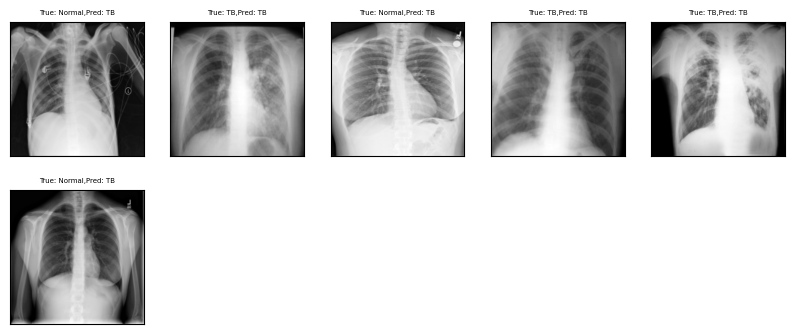

In [111]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decays=0
dropout_rates=0
lr=0.01

for opt_name, opt_class in optimizers:
    print(f'Running experiment with model: SimpleCNN for comparision, with optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
    result = run_experiment_Imgpred(SimpleCNN, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)

Running experiment with model: ResNet18 for comparision, with optimizer: MOMENTUM, learning rate: 0.01, batch size: 64, weight_decay: 0


C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vrush\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/5], Train Loss: 0.2180, Val Loss: 0.1282, Train Accuracy: 91.96%, Val Accuracy: 95.24%
Epoch [2/5], Train Loss: 0.0546, Val Loss: 0.0518, Train Accuracy: 97.99%, Val Accuracy: 97.92%
Epoch [3/5], Train Loss: 0.0248, Val Loss: 0.0360, Train Accuracy: 99.33%, Val Accuracy: 98.66%
Epoch [4/5], Train Loss: 0.0225, Val Loss: 0.0258, Train Accuracy: 99.33%, Val Accuracy: 99.11%
Epoch [5/5], Train Loss: 0.0122, Val Loss: 0.0370, Train Accuracy: 99.63%, Val Accuracy: 98.81%
Test Loss: 0.0192, Test Accuracy: 99.64%


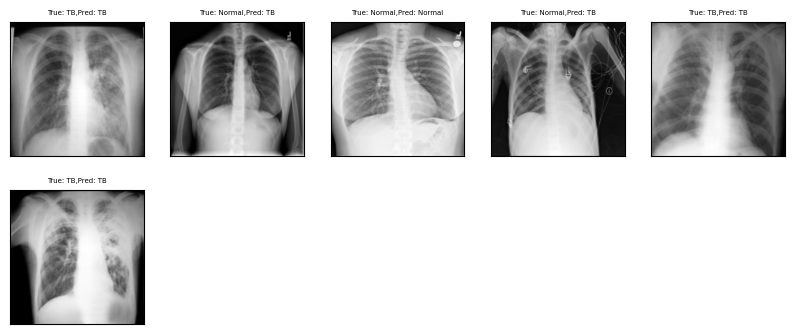

In [112]:
optimizers = [('MOMENTUM', optim.SGD),]
batch_size = 64
num_epochs = 5
weight_decays=0
dropout_rates=0
lr=0.01

for opt_name, opt_class in optimizers:
    print(f'Running experiment with model: ResNet18 for comparision, with optimizer: {opt_name}, learning rate: {lr}, batch size: {batch_size}, weight_decay: {weight_decay}')
    result = run_experiment_Imgpred(ResNet18, opt_class,opt_name, lr, batch_size, num_epochs,weight_decay,dropout_rate)